---
title: Ex.) 논문용 그림
subtitle: 251111 Draw Graph.ipynb 파일에서 작성됨
---

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from TO_sim.Sol_Kuramoto import Sol_Kuramoto_mK as mK
from TO_sim.Sol_Kuramoto import Sol_Kuramoto_mf2 as mf2

from TO_sim.gen_Distribution import Quantile_Normal as Q_Normal
from TO_sim.gen_Distribution import Quantile_Lorentzian as Q_Lorentzian

from TO_sim.get_cluster import cluster_os_new2
from TO_sim.get_sec_r import get_r_Fun,get_rp,get_rp2,get_rp3,integrand_Rd3
from scipy import interpolate

import pandas as pd
from tqdm.notebook import tqdm

In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['font.size'] = 16               # 본문 크기
mpl.rcParams['axes.labelsize'] = 18         # 축 라벨
mpl.rcParams['xtick.labelsize'] = 16
mpl.rcParams['ytick.labelsize'] = 16
mpl.rcParams['legend.fontsize'] = 16
mpl.rcParams['mathtext.fontset'] = 'cm'      # LaTeX 수식은 Computer Modern 유지
mpl.rcParams['axes.linewidth'] = 1.0         # 논문용 선 두께

def nan_corrcoef(a,b):
    a = a.flatten()
    b = b.flatten()
    nan_idx1 = np.isnan(a)
    nan_idx2 = np.isnan(b)
    nan_idx = nan_idx1 | nan_idx2
    a = a[~nan_idx]
    b = b[~nan_idx]
    return np.corrcoef(a,b)[0,1]


In [3]:
seed =11
N = 5000
theta_random,omega,Kc = Q_Normal(N,0,1,seed=seed)
# theta_random,omega,Kc = Q_Lorentzian(N,0,1,seed=seed)

omega = omega - np.mean(omega)
omega = np.sort(omega)
m = 6
dt = 0.1
t = np.arange(0,10200,dt)
# K = 5.3
K = 6
to_ppi = lambda y: (y + np.pi)%(2*np.pi) - np.pi
theta, dtheta,rs = mf2(K,N=N,m=m,t_array=t,p_theta=theta_random,p_dtheta=theta_random,p_omega=omega)

In [4]:
del dtheta

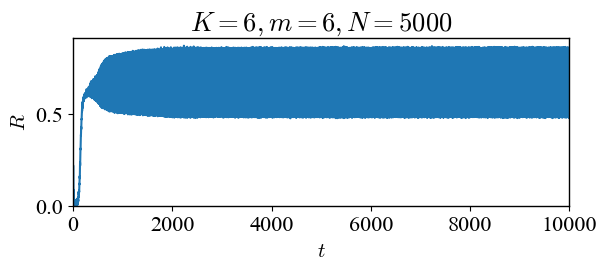

In [ ]:
#| label: img:kuramoto_mf2_r_time
# Kuramoto model R graph(K=6, m=6, N=5000)
plt.subplot(211)
plt.plot(t,rs)
plt.xlabel(r'$t$',fontsize=15)
plt.ylabel(r'$R$',fontsize=15)
plt.xlim(0,1e4)
plt.ylim(0,)
plt.title(rf'$K={K},m={m},N={N}$')
plt.show()

In [6]:
plt.figure().get_size_inches()

array([6.4, 4.8])

<Figure size 640x480 with 0 Axes>

C:\Users\kim9y\AppData\Local\Temp\ipykernel_43848\142577887.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


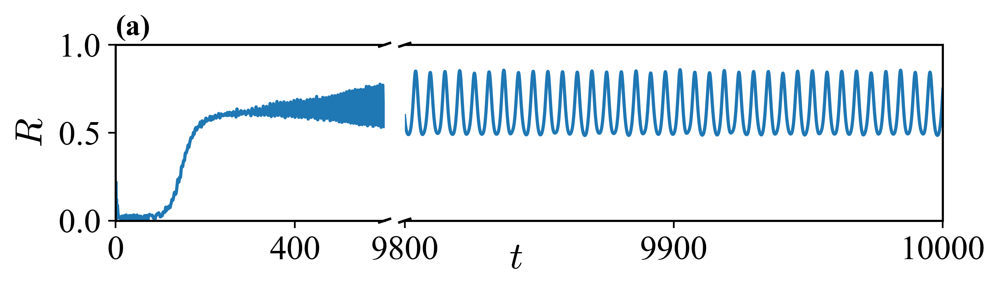

In [53]:
import matplotlib.pyplot as plt

# === 원하는 구간/비율/간격/표식 크기 설정 ===
LEFT_XLIM   = (0, 600)         # 왼쪽 x 구간
RIGHT_XLIM  = (9800, 10000)     # 오른쪽 x 구간
WIDTH_RATIOS = [1, 2]           # 두 축의 가로폭 비(왼쪽:오른쪽)
WSPACE       = 0.05             # 두 축 사이 간격(작을수록 붙음)
SLASH_SIZE   = 0.01            # // 크기 (축 상대좌표: 0~1)
SLASH_WIDTH  = 1.2              # // 선 굵기
SLASH_COLOR  = 'k'              # // 색
SLASH_ANGLE  = '//'             # 모양을 약간 바꾸고 싶으면 아래 수동 그리기 참고

fig, (ax1, ax2) = plt.subplots(
    1, 2, sharey=False, figsize=(7, 9/2/3),
    gridspec_kw={'width_ratios': WIDTH_RATIOS, 'wspace': WSPACE},
    dpi=500
)
ax1.set_xticks([0,400],[0,400])
ax2.set_xticks([9800,9900,10000],[9800,9900,10000])
# 왼쪽/오른쪽 x범위
ax1.set_xlim(*LEFT_XLIM)
ax2.set_xlim(*RIGHT_XLIM)

# (옵션) 중간 스파인/틱 정리 - 잘린 느낌 강화
ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax1.yaxis.tick_left()
ax2.yaxis.tick_right()

# ---- 여기부터 데이터 그리기 (네가 쓰던 코드 유지) ----
# 예시: 원시/최대/최소 곡선(왼쪽)
ax1.plot(t,rs)
ax2.plot(t,rs)

# --------------------------------------------------
ax1.set_ylim(0,1)
# 잘린 표시(//) 크기/두께/색 조절
d = SLASH_SIZE
kwargs = dict(clip_on=False, color=SLASH_COLOR, linewidth=SLASH_WIDTH)

# 왼쪽 축 끝(오른쪽 테두리)에 //
ax1.plot((1-d*WIDTH_RATIOS[1], 1+d*WIDTH_RATIOS[1]), (-d, +d), transform=ax1.transAxes, **kwargs)   # 우하향
ax1.plot((1-d*WIDTH_RATIOS[1], 1+d*WIDTH_RATIOS[1]), (1-d, 1+d), transform=ax1.transAxes, **kwargs) # 우상향

# 오른쪽 축 시작(왼쪽 테두리)에 //
ax2.plot((-d*WIDTH_RATIOS[0], +d*WIDTH_RATIOS[0]), (-d, +d), transform=ax2.transAxes, **kwargs)     # 좌하향
ax2.plot((-d*WIDTH_RATIOS[0], +d*WIDTH_RATIOS[0]), (1-d, 1+d), transform=ax2.transAxes, **kwargs)   # 좌상향
ax2.set_yticks([])
ax2.set_ylim(0,1)
# 라벨
ax1.set_ylabel(r"$R$", fontsize=18)
fig.text(0.5, -0.1, r"$t$", ha="center", fontsize=18)
from matplotlib.ticker import EngFormatter

# 지수 표기 (10^3 식) 포맷터 생성


ax1.text(0.0, 1.02, '(a)', transform=ax1.transAxes, fontsize=14, fontweight='bold',
         va='bottom', ha='left')
plt.tight_layout()
plt.show()


In [9]:
s_lang = 2000
avg_dtheta = (theta[s_lang:] - theta[0:-s_lang])/(t[s_lang]-t[0])
v_t = avg_dtheta[-1]

In [10]:
con0 = np.abs(v_t - v_t[N//2]) < 0.15
c_0, = np.where(con0)
c_s = {}
c_s['0'] = c_0
c_p, = np.where(np.logical_and(~con0, omega > 0))
c_m, = np.where(np.logical_and(~con0, omega < 0))
if len(c_p) > 0:
	conp = np.abs(v_t - np.min(v_t[c_p])) < 0.02
	c_p0, = np.where(conp)
	c_s['+'] = c_p
	if len(c_p0) > 0:
		c_s['+l'] = c_p0
if len(c_m) > 0:
	conm = np.abs(v_t - np.max(v_t[c_m])) < 0.02
	c_m0, = np.where(conm)
	c_s['-'] = c_m
	if len(c_m0) > 0:
		c_s['-l'] = c_m0

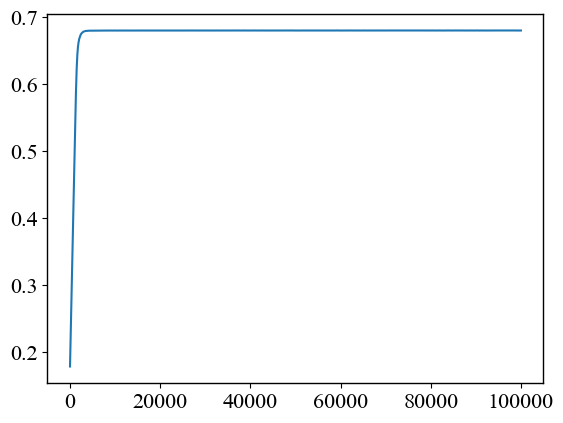

In [11]:
r0 = np.abs(np.mean(np.exp(1j*theta[:,c_0]),axis=1) * len(c_0)/N)
rp_ = np.abs(np.mean(np.exp(1j*theta[:,c_p]),axis=1) * len(c_p)/N)
rm_ = np.abs(np.mean(np.exp(1j*theta[:,c_m]),axis=1) * len(c_m)/N)
r_s = np.array([np.mean(rs[i:s_lang+i]) for i in range(len(rs)-s_lang)])
r0_s = np.array([np.mean(r0[i:s_lang+i]) for i in range(len(r0)-s_lang)])
rp_s = np.array([np.mean(rp_[i:s_lang+i]) for i in range(len(rp_)-s_lang)])
rm_s = np.array([np.mean(rm_[i:s_lang+i]) for i in range(len(rm_)-s_lang)])

plt.plot(np.abs(r0_s))

In [12]:
OPS = 4/np.pi * np.sqrt(K*r_s/m) - 0.3056/np.sqrt(K*r_s*m**3)
opp = 4/np.pi * np.sqrt(K*rp_s/m) - 0.3056/np.sqrt(K*rp_s*m**3)
dps =  1/2 *m*K*K*r0_s*rp_s/(m**2 * OPS**2 + 1) + K*K* rp_s*rp_s/(4*OPS*(1+4*OPS**2*m**2))

In [12]:
linestyle_str = [
     ('solid', 'solid'),      # Same as (0, ()) or '-'
     ('dotted', 'dotted'),    # Same as (0, (1, 1)) or '.'
     ('dashed', 'dashed'),    # Same as '--'
     ('dashdot', 'dashdot')]  # Same as '-.'

linestyle_tuple = [
     ('loosely dotted',        (0, (1, 10))),
     ('dotted',                (0, (1, 1))),
     ('densely dotted',        (0, (1, 1))),

     ('loosely dashed',        (0, (5, 10))),
     ('dashed',                (0, (5, 5))),
     ('densely dashed',        (0, (5, 1))),

     ('loosely dashdotted',    (0, (3, 10, 1, 10))),
     ('dashdotted',            (0, (3, 5, 1, 5))),
     ('densely dashdotted',    (0, (3, 1, 1, 1))),

     ('dashdotdotted',         (0, (3, 5, 1, 5, 1, 5))),
     ('loosely dashdotdotted', (0, (3, 10, 1, 10, 1, 10))),
     ('densely dashdotdotted', (0, (3, 1, 1, 1, 1, 1)))]


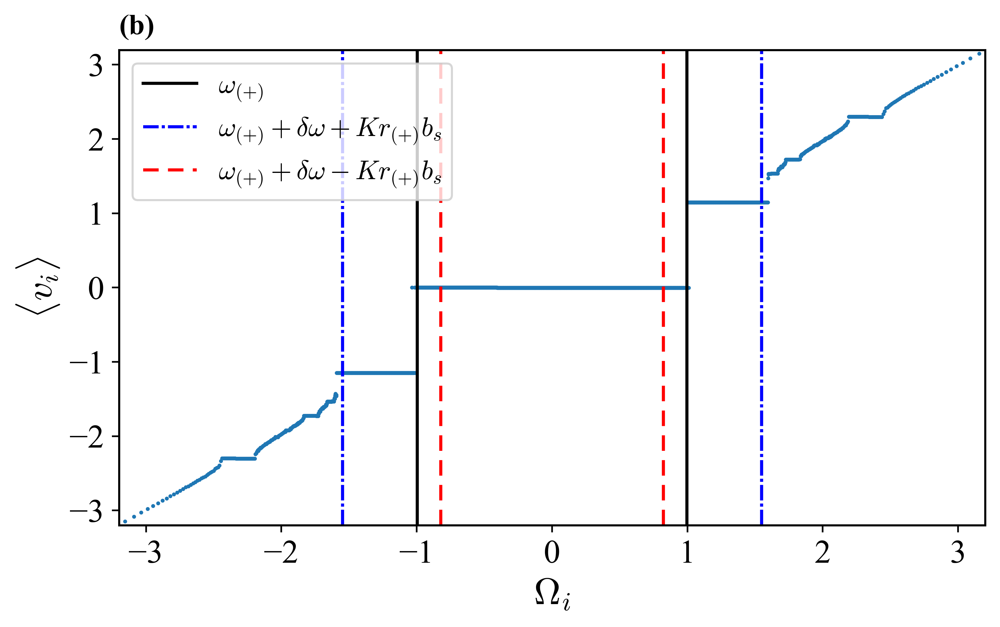

In [63]:
idx = -100
plt.figure(dpi = 500,figsize=(7, 9/2),)
# plt.title(rf'$t={t[idx]:.01f},R={r_s[idx]:.02f},R_0={r0_s[idx]:.02f},r_+={rp_s[idx]:.02f},r_-={rm_s[idx]:.02f}$')
plt.axvline(OPS[idx],color='k',label=r'$\omega_{(+)}$')
plt.axvline(-OPS[idx],color='k')
plt.ylim(-3.2,3.2)
plt.xlim(-3.2,3.2)

plt.axvline(OPS[idx]+dps[idx]+opp[idx],color='b',linestyle=(0, (5, 1, 1, 1)),label=r'$\omega_{(+)}+\delta\omega+Kr_{(+)}b_s$')
plt.axvline(OPS[idx]+dps[idx]-opp[idx],color='r',linestyle=(0, (5, 3)),label=r'$\omega_{(+)}+\delta\omega-Kr_{(+)}b_s$')

plt.axvline(-(OPS[idx]+dps[idx]+opp[idx]),color='b', linestyle=(0, (5, 1, 1, 1)))
plt.axvline(-(OPS[idx]+dps[idx]-opp[idx]),color='r',linestyle=(0, (5, 3)),)
plt.xlabel(r'$\Omega_i$',fontsize=18)
plt.ylabel(r'$\langle v_i \rangle$',fontsize=18)
# plt.grid()
plt.legend(fontsize=13,ncol=1,loc='upper left',frameon=True)
plt.scatter(omega,avg_dtheta[idx],s=0.8)
ax1 = plt.gca()
ax1.text(0.0, 1.02, '(b)', transform=ax1.transAxes, fontsize=14, fontweight='bold',
         va='bottom', ha='left')
plt.tight_layout()
plt.show()

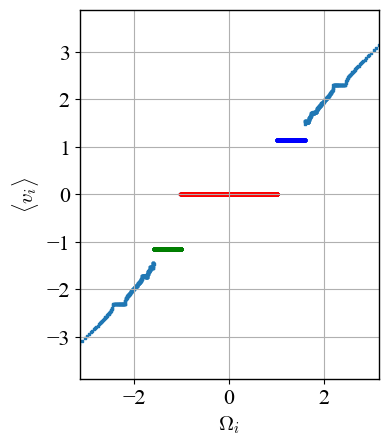

In [15]:
v_t = avg_dtheta[-1]



c_p, = np.where(np.logical_and(~con0, omega > 0))
c_m, = np.where(np.logical_and(~con0, omega < 0))

plt.scatter(omega,v_t,marker='s',s=0.8)
plt.scatter(omega[c_0],v_t[c_0],marker='s',color='r',s=1)
plt.scatter(omega[c_p0],v_t[c_p0],marker='s',color='b',s=1)
plt.scatter(omega[c_m0],v_t[c_m0],marker='s',color='g',s=1)
plt.xlabel(r'$\Omega_i$',fontsize=15)
plt.ylabel(r'$\langle v_i \rangle$',fontsize=15)
plt.xlim(-np.pi,np.pi)
plt.gca().set_aspect('equal')
plt.grid()
# plt.ylim(-0.1,0.1)
# plt.title(rf'$K={K},m={m},N={N}$')

In [16]:
r0 = np.abs(np.mean(np.exp(1j*theta[:,c_0]),axis=1) * len(c_0)/N)
rp_0 = np.abs(np.mean(np.exp(1j*theta[:,c_p0]),axis=1) * len(c_p)/N)
rm_0 = np.abs(np.mean(np.exp(1j*theta[:,c_m0]),axis=1) * len(c_m)/N)

rho_0 = np.abs(np.mean(np.exp(1j*theta[:,c_0]),axis=1) )
rho_p = np.abs(np.mean(np.exp(1j*theta[:,c_p0]),axis=1))
rho_m= np.abs(np.mean(np.exp(1j*theta[:,c_m0]),axis=1) )

rho_m_0 = np.array([np.mean(rho_0[i:s_lang+i]) for i in range(len(rho_0)-s_lang)])
rho_m_p = np.array([np.mean(rho_p[i:s_lang+i]) for i in range(len(rho_p)-s_lang)])
rho_m_m = np.array([np.mean(rho_m[i:s_lang+i]) for i in range(len(rho_m)-s_lang)])

std_m_0 = np.array([np.nanstd(rho_0[i:s_lang+i]) for i in range(len(rho_0)-s_lang)])
std_m_p = np.array([np.nanstd(rho_p[i:s_lang+i]) for i in range(len(rho_p)-s_lang)])
std_m_m = np.array([np.nanstd(rho_m[i:s_lang+i]) for i in range(len(rho_m)-s_lang)])
r_p = np.abs(np.mean(np.exp(1j*theta[:,c_p]),axis=1) * len(c_p)/N)
r_m = np.abs(np.mean(np.exp(1j*theta[:,c_m]),axis=1) * len(c_m)/N)

C:\Users\kim9y\AppData\Local\Temp\ipykernel_43848\1849682695.py:13: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim(0,10000)


(0.05623416063624878, 10000)

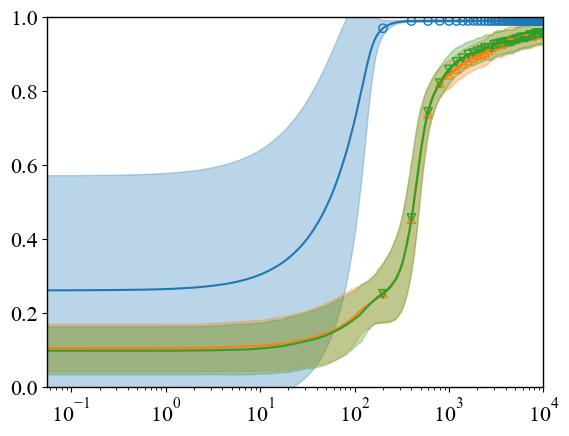

In [23]:


l0, = plt.plot(t[:-s_lang],rho_m_0)
lp, = plt.plot(t[:-s_lang],rho_m_p)
lm, = plt.plot(t[:-s_lang],rho_m_m)
plt.fill_between(t[:-s_lang],rho_m_0-std_m_0,rho_m_0+std_m_0,color=l0.get_color(),alpha=0.3)
plt.fill_between(t[:-s_lang],rho_m_p-std_m_p,rho_m_p+std_m_p,color=lp.get_color(),alpha=0.3)
plt.fill_between(t[:-s_lang],rho_m_m-std_m_m,rho_m_m+std_m_m,color=lm.get_color(),alpha=0.3)

plt.scatter(t[:-s_lang:2000],rho_m_0[::2000],marker='o',facecolors='none',color=l0.get_color())
plt.scatter(t[:-s_lang:2000],rho_m_p[::2000],marker='^',facecolors='none',color=lp.get_color())
plt.scatter(t[:-s_lang:2000],rho_m_m[::2000],marker='v',facecolors='none',color=lm.get_color())
plt.xscale('log')
plt.ylim(0,1)
plt.xlim(0,10000)


C:\Users\kim9y\AppData\Local\Temp\ipykernel_43848\1726780990.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


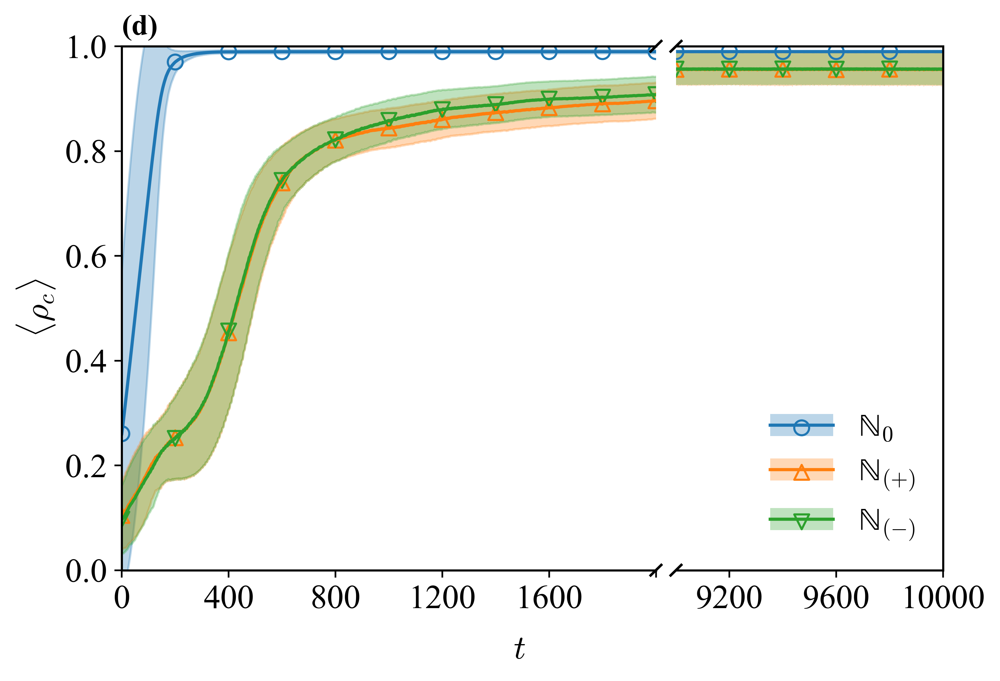

In [61]:


# === 원하는 구간/비율/간격/표식 크기 설정 ===
LEFT_XLIM   = (0, 2000)         # 왼쪽 x 구간
RIGHT_XLIM  = (9000, 10000)     # 오른쪽 x 구간
WIDTH_RATIOS = [2, 1]           # 두 축의 가로폭 비(왼쪽:오른쪽)
WSPACE       = 0.05             # 두 축 사이 간격(작을수록 붙음)
SLASH_SIZE   = 0.010            # // 크기 (축 상대좌표: 0~1)
SLASH_WIDTH  = 1.2              # // 선 굵기
SLASH_COLOR  = 'k'              # // 색
SLASH_ANGLE  = '//'             # 모양을 약간 바꾸고 싶으면 아래 수동 그리기 참고

fig, (ax1, ax2) = plt.subplots(
    1, 2, sharey=False, figsize=(7, 9/2),
    gridspec_kw={'width_ratios': WIDTH_RATIOS, 'wspace': WSPACE},
    dpi=500
)
ax1.set_xticks([0,400,800,1200,1600,2000],[0,400,800,1200,1600,""])
ax2.set_xticks([9200,9600,10000],[9200,9600,10000])
# 왼쪽/오른쪽 x범위
ax1.set_xlim(*LEFT_XLIM)
ax2.set_xlim(*RIGHT_XLIM)

# (옵션) 중간 스파인/틱 정리 - 잘린 느낌 강화
ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax1.yaxis.tick_left()
ax2.yaxis.tick_right()

# ---- 여기부터 데이터 그리기 (네가 쓰던 코드 유지) ----
# 예시: 원시/최대/최소 곡선(왼쪽)
l0, = ax1.plot(t[:-s_lang],rho_m_0)
lp, = ax1.plot(t[:-s_lang],rho_m_p)
lm, = ax1.plot(t[:-s_lang],rho_m_m)
ax1.fill_between(t[:-s_lang],rho_m_0-std_m_0,rho_m_0+std_m_0,color=l0.get_color(),alpha=0.3)
ax1.fill_between(t[:-s_lang],rho_m_p-std_m_p,rho_m_p+std_m_p,color=lp.get_color(),alpha=0.3)
ax1.fill_between(t[:-s_lang],rho_m_m-std_m_m,rho_m_m+std_m_m,color=lm.get_color(),alpha=0.3)

ax1.scatter(t[:-s_lang:2000],rho_m_0[::2000],marker='o',facecolors='none',color=l0.get_color(),s=50)
ax1.scatter(t[:-s_lang:2000],rho_m_p[::2000],marker='^',facecolors='none',color=lp.get_color(),s=50)
ax1.scatter(t[:-s_lang:2000],rho_m_m[::2000],marker='v',facecolors='none',color=lm.get_color(),s=50)

# 오른쪽도 동일
l0, = ax2.plot(t[:-s_lang],rho_m_0)
lp, = ax2.plot(t[:-s_lang],rho_m_p)
lm, = ax2.plot(t[:-s_lang],rho_m_m)
b0 = ax2.fill_between(t[:-s_lang],rho_m_0-std_m_0,rho_m_0+std_m_0,alpha=0.3)
bp = ax2.fill_between(t[:-s_lang],rho_m_p-std_m_p,rho_m_p+std_m_p,alpha=0.3)
bm = ax2.fill_between(t[:-s_lang],rho_m_m-std_m_m,rho_m_m+std_m_m,alpha=0.3)
s0 = ax2.scatter(t[:-s_lang:2000],rho_m_0[::2000],marker='o',facecolors='none',color=l0.get_color(),s=50)
sp = ax2.scatter(t[:-s_lang:2000],rho_m_p[::2000],marker='^',facecolors='none',color=lp.get_color(),s=50)
sm = ax2.scatter(t[:-s_lang:2000],rho_m_m[::2000],marker='v',facecolors='none',color=lm.get_color(),s=50)

ax2.set_yticks([])
ax2.set_ylim(0,1)
ax2.legend([(l0,b0,s0),(lp,bp,sp),(lm,bm,sm)],[r'$\rm{\mathbb{N}}_0$',r'$\rm{\mathbb{N}}_{(+)}$',r'$\rm{\mathbb{N}}_{(-)}$'],loc='lower right',fontsize=15,frameon=False)
# --------------------------------------------------
ax1.set_ylim(0,1)
# 잘린 표시(//) 크기/두께/색 조절
d = SLASH_SIZE
kwargs = dict(clip_on=False, color=SLASH_COLOR, linewidth=SLASH_WIDTH)

# 왼쪽 축 끝(오른쪽 테두리)에 //
ax1.plot((1-d*WIDTH_RATIOS[1], 1+d*WIDTH_RATIOS[1]), (-d, +d), transform=ax1.transAxes, **kwargs)   # 우하향
ax1.plot((1-d*WIDTH_RATIOS[1], 1+d*WIDTH_RATIOS[1]), (1-d, 1+d), transform=ax1.transAxes, **kwargs) # 우상향

# 오른쪽 축 시작(왼쪽 테두리)에 //
ax2.plot((-d*WIDTH_RATIOS[0], +d*WIDTH_RATIOS[0]), (-d, +d), transform=ax2.transAxes, **kwargs)     # 좌하향
ax2.plot((-d*WIDTH_RATIOS[0], +d*WIDTH_RATIOS[0]), (1-d, 1+d), transform=ax2.transAxes, **kwargs)   # 좌상향

# 라벨
ax1.set_ylabel(r"$\langle \rho_c \rangle$", fontsize=16)
fig.text(0.5, -0.02, r"$t$", ha="center", fontsize=16)
ax1.text(0.0, 1.01, '(d)', transform=ax1.transAxes, fontsize=14, fontweight='bold',
         va='bottom', ha='left')
plt.tight_layout()
plt.show()


In [32]:
m_v_0 = np.mean(avg_dtheta[::1,c_0],axis=1)
m_v_p = np.mean(avg_dtheta[::1,c_p0],axis=1)
m_v_m = np.mean(avg_dtheta[::1,c_m0],axis=1)
std_v_0 = np.std(avg_dtheta[::1,c_0],axis=1)
std_v_p = np.std(avg_dtheta[::1,c_p0],axis=1)
std_v_m = np.std(avg_dtheta[::1,c_m0],axis=1)
max_v_0 = np.max(avg_dtheta[::1,c_0],axis=1)
min_v_0 = np.min(avg_dtheta[::1,c_0],axis=1)  
max_v_p = np.max(avg_dtheta[::1,c_p0],axis=1)
min_v_p = np.min(avg_dtheta[::1,c_p0],axis=1)
max_v_m = np.max(avg_dtheta[::1,c_m0],axis=1)
min_v_m = np.min(avg_dtheta[::1,c_m0],axis=1) 

In [17]:
for i in range(10):
	plt.close()

C:\Users\kim9y\AppData\Local\Temp\ipykernel_43848\1114296568.py:79: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


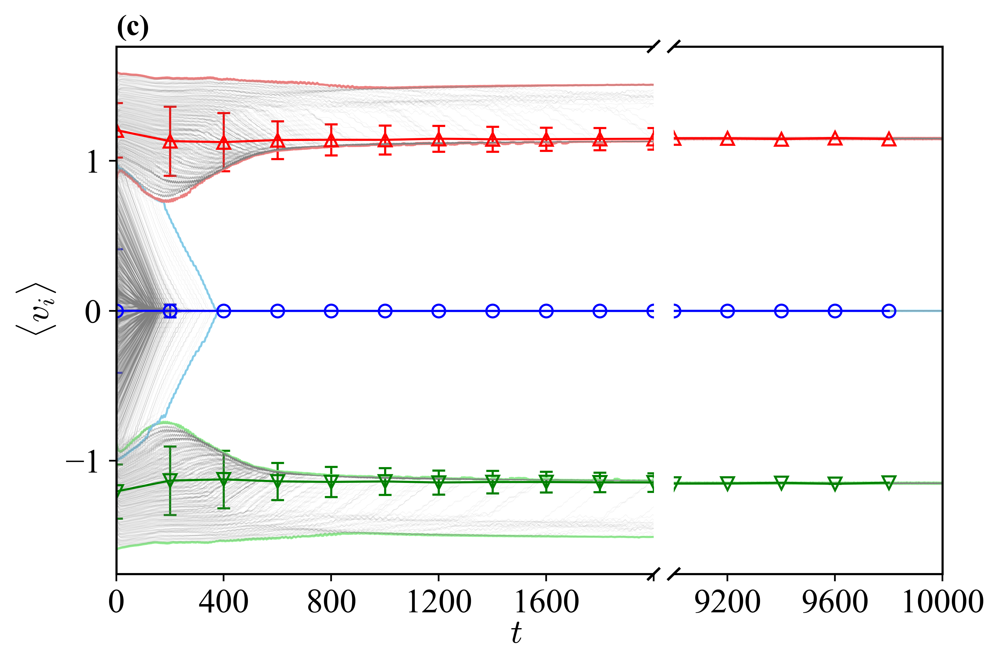

In [62]:

# === 원하는 구간/비율/간격/표식 크기 설정 ===
LEFT_XLIM   = (0, 2000)         # 왼쪽 x 구간
RIGHT_XLIM  = (9000, 10000)     # 오른쪽 x 구간
WIDTH_RATIOS = [2, 1]           # 두 축의 가로폭 비(왼쪽:오른쪽)
WSPACE       = 0.05             # 두 축 사이 간격(작을수록 붙음)
SLASH_SIZE   = 0.010            # // 크기 (축 상대좌표: 0~1)
SLASH_WIDTH  = 1.2              # // 선 굵기
SLASH_COLOR  = 'k'              # // 색
SLASH_ANGLE  = '//'             # 모양을 약간 바꾸고 싶으면 아래 수동 그리기 참고

fig, (ax1, ax2) = plt.subplots(
    1, 2, sharey=False, figsize=(7, 9/2),
    gridspec_kw={'width_ratios': WIDTH_RATIOS, 'wspace': WSPACE},
    dpi=500
)
ax1.set_xticks([0,400,800,1200,1600,2000],[0,400,800,1200,1600,""])
ax2.set_xticks([9200,9600,10000],[9200,9600,10000])
# 왼쪽/오른쪽 x범위
ax1.set_xlim(*LEFT_XLIM)
ax2.set_xlim(*RIGHT_XLIM)
ax2.set_yticks([])
# (옵션) 중간 스파인/틱 정리 - 잘린 느낌 강화
ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax1.yaxis.tick_left()
ax2.yaxis.tick_right()


# ---- 여기부터 데이터 그리기 (네가 쓰던 코드 유지) ----
# 예시: 원시/최대/최소 곡선(왼쪽)
ax1.errorbar(t[:-s_lang:2000],m_v_0[::2000],yerr=std_v_0[::2000],color='b',lw=1,alpha=1.0,capsize=3,marker='o',fillstyle='none');
ax1.errorbar(t[:-s_lang:2000],m_v_p[::2000],yerr=std_v_p[::2000],color='r',lw=1,alpha=1.0,capsize=3,marker='^',fillstyle='none');
ax1.errorbar(t[:-s_lang:2000],m_v_m[::2000],yerr=std_v_m[::2000],color='g',lw=1,alpha=1.0,capsize=3,marker='v',fillstyle='none');
ax1.plot(t[:-s_lang],max_v_0,color='skyblue',lw=1,alpha=1.0);
ax1.plot(t[:-s_lang],max_v_p,color='lightcoral',lw=1,alpha=1.0);
ax1.plot(t[:-s_lang],max_v_m,color='lightgreen',lw=1,alpha=1.0);
ax1.plot(t[:-s_lang],min_v_0,color='skyblue',lw=1,alpha=1.0);
ax1.plot(t[:-s_lang],min_v_p,color='lightcoral',lw=1,alpha=1.0);
ax1.plot(t[:-s_lang],min_v_m,color='lightgreen',lw=1,alpha=1.0);
ax1.plot(t[:-s_lang:1],avg_dtheta[::1,c_0],c='grey',alpha=0.1,lw=0.2);
ax1.plot(t[:-s_lang:1],avg_dtheta[::1,c_p0],c='grey',alpha=0.1,lw=0.2);
ax1.plot(t[:-s_lang:1],avg_dtheta[::1,c_m0],c='grey',alpha=0.1,lw=0.2);
# ax1.plot(t[:-s_lang:1],avg_dtheta[::1,n_c],c='lightgrey',alpha=0.1,lw=0.2);


# 오른쪽도 동일
ax2.errorbar(t[:-s_lang:2000],m_v_0[::2000],yerr=std_v_0[::2000],color='b',lw=1,alpha=1.0,capsize=3,marker='o',fillstyle='none');
ax2.errorbar(t[:-s_lang:2000],m_v_p[::2000],yerr=std_v_p[::2000],color='r',lw=1,alpha=1.0,capsize=3,marker='^',fillstyle='none');
ax2.errorbar(t[:-s_lang:2000],m_v_m[::2000],yerr=std_v_m[::2000],color='g',lw=1,alpha=1.0,capsize=3,marker='v',fillstyle='none');
ax2.plot(t[:-s_lang],max_v_0,color='skyblue',lw=1,alpha=1.0);
ax2.plot(t[:-s_lang],max_v_p,color='lightcoral',lw=1,alpha=1.0);
ax2.plot(t[:-s_lang],max_v_m,color='lightgreen',lw=1,alpha=1.0);
ax2.plot(t[:-s_lang],min_v_0,color='skyblue',lw=1,alpha=1.0);
ax2.plot(t[:-s_lang],min_v_p,color='lightcoral',lw=1,alpha=1.0);
ax2.plot(t[:-s_lang],min_v_m,color='lightgreen',lw=1,alpha=1.0);
ax2.plot(t[:-s_lang:1],avg_dtheta[::1,c_0],c='grey',alpha=0.1,lw=0.2);
ax2.plot(t[:-s_lang:1],avg_dtheta[::1,c_p0],c='grey',alpha=0.1,lw=0.2);
ax2.plot(t[:-s_lang:1],avg_dtheta[::1,c_m0],c='grey',alpha=0.1,lw=0.2);
# ax2.plot(t[:-s_lang:1],avg_dtheta[::10,n_c],c='lightgrey',alpha=0.1,lw=0.2);
# --------------------------------------------------

# 잘린 표시(//) 크기/두께/색 조절
d = SLASH_SIZE
kwargs = dict(clip_on=False, color=SLASH_COLOR, linewidth=SLASH_WIDTH)

# 왼쪽 축 끝(오른쪽 테두리)에 //
ax1.plot((1-d, 1+d), (-d, +d), transform=ax1.transAxes, **kwargs)   # 우하향
ax1.plot((1-d, 1+d), (1-d, 1+d), transform=ax1.transAxes, **kwargs) # 우상향

# 오른쪽 축 시작(왼쪽 테두리)에 //
ax2.plot((-d*2, +d*2), (-d, +d), transform=ax2.transAxes, **kwargs)     # 좌하향
ax2.plot((-d*2, +d*2), (1-d, 1+d), transform=ax2.transAxes, **kwargs)   # 좌상향

# 라벨
ax1.set_ylabel(r"$\langle v_i \rangle$", fontsize=16)
fig.text(0.5, 0.01, r"$t$", ha="center", fontsize=16)
ax1.text(0.0, 1.01, '(c)', transform=ax1.transAxes, fontsize=14, fontweight='bold',
         va='bottom', ha='left')
plt.tight_layout()
plt.show()


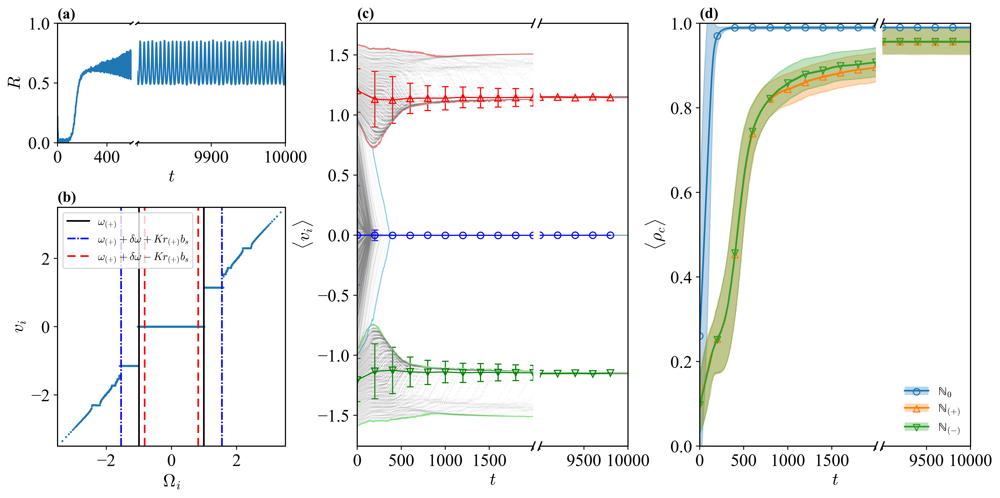

In [ ]:
#| label: fig:paper_fig_1
#| caption: 논문용 그림 2. $N = 5000, K = 6, m = 6, t_{end} = 10000$으로 시뮬레이션 한 결과
import matplotlib.pyplot as plt

# ===== 공통 설정 =====
LEFT_XLIM   = (0, 600)
RIGHT_XLIM  = (9800, 10000)
WIDTH_RATIOS_BROKEN = [2, 1]   # broken x에서 왼쪽:오른쪽 축 폭 비
WSPACE_BROKEN = 0.05
SLASH_SIZE  = 0.010
SLASH_WIDTH = 1.2
SLASH_COLOR = 'k'

def add_break(axL, axR, d=SLASH_SIZE, lw=SLASH_WIDTH, color=SLASH_COLOR,w_r=WIDTH_RATIOS_BROKEN):
    """좌/우 축에 // 표시 및 경계 스파인 정리"""
    axL.spines['right'].set_visible(False)
    axR.spines['left'].set_visible(False)
    axL.yaxis.tick_left()
    axR.yaxis.tick_right()
    kw = dict(clip_on=False, color=color, linewidth=lw)
    axL.plot((1-d*w_r[1], 1+d*w_r[1]), (-d, +d), transform=axL.transAxes, **kw)
    axL.plot((1-d*w_r[1], 1+d*w_r[1]), (1-d, 1+d), transform=axL.transAxes, **kw)
    axR.plot((-d*w_r[0], +d*w_r[0]), (-d, +d), transform=axR.transAxes, **kw)
    axR.plot((-d*w_r[0], +d*w_r[0]), (1-d, 1+d), transform=axR.transAxes, **kw)

# ===== 바깥 레이아웃: (행 2) x (열 3) =====
fig = plt.figure(figsize=(15, 7), dpi=500)
outer = fig.add_gridspec(
    nrows=2, ncols=3,
    width_ratios=[1.01, 1.2, 1.2],   # 3개 열
    height_ratios=[1, 2],            # 왼쪽열 (a):(b)=1:2
    wspace=0.28, hspace=0.36
)

# ---------- (a) : 왼쪽열-위, R(t), broken x ----------

LEFT_XLIM   = (0, 600)
RIGHT_XLIM  = (9800, 10000)
WIDTH_RATIOS_BROKEN = [1, 2]   # broken x에서 왼쪽:오른쪽 축 폭 비
gs_a = outer[0,0].subgridspec(1, 2, width_ratios=WIDTH_RATIOS_BROKEN, wspace=WSPACE_BROKEN)
ax_aL = fig.add_subplot(gs_a[0,0])
ax_aR = fig.add_subplot(gs_a[0,1])
ax_aL.set_xlim(*LEFT_XLIM);  ax_aR.set_xlim(*RIGHT_XLIM)
ax_aL.set_ylim(0,1);ax_aR.set_ylim(0,1)
ax_aL.set_xticks([0,400]); ax_aL.set_xticklabels([0,400])
ax_aR.set_xticks([9800,9900,10000]); ax_aR.set_xticklabels(["",9900,10000])
ax_aR.set_yticks([])
add_break(ax_aL, ax_aR, w_r=[1,2])

# (a) 데이터
ax_aL.plot(t, rs); ax_aR.plot(t, rs)
ax_aL.set_ylim(0,1)
ax_aL.set_ylabel(r"$R$", fontsize=16)
ax_aL.text(0.0, 1.015, '(a)', transform=ax_aL.transAxes, fontsize=14, fontweight='bold',
           va='bottom', ha='left')

# ---------- (b) : 왼쪽열-아래, v_i vs Ω_i ----------

LEFT_XLIM   = (0, 2000)
RIGHT_XLIM  = (9000, 10000)
WIDTH_RATIOS_BROKEN = [2, 1]   # broken x에서 왼쪽:오른쪽 축 폭 비
ax_b = fig.add_subplot(outer[1,0])

# (b) 데이터
idx = -100
ax_b.axvline(OPS[idx],  color='k', label=r'$\omega_{(+)}$')
ax_b.axvline(-OPS[idx], color='k')
ax_b.axvline(OPS[idx]+dps[idx]+opp[idx], color='b', linestyle=(0,(5,1,1,1)),
             label=r'$\omega_{(+)}+\delta\omega+Kr_{(+)}b_s$')
ax_b.axvline(OPS[idx]+dps[idx]-opp[idx], color='r', linestyle=(0,(5,3)),
             label=r'$\omega_{(+)}+\delta\omega-Kr_{(+)}b_s$')
ax_b.axvline(-(OPS[idx]+dps[idx]+opp[idx]), color='b', linestyle=(0,(5,1,1,1)))
ax_b.axvline(-(OPS[idx]+dps[idx]-opp[idx]), color='r', linestyle=(0,(5,3)))
ax_b.scatter(omega, avg_dtheta[idx], s=0.8)
ax_b.set_xlim(-3.5, 3.5); ax_b.set_ylim(-3.5, 3.5)
ax_b.set_xlabel(r'$\Omega_i$', fontsize=16); ax_b.set_ylabel(r'$v_i$', fontsize=16)
ax_b.legend(fontsize=10, ncol=1, loc='upper left', frameon=True)
ax_b.text(0.0, 1.01, '(b)', transform=ax_b.transAxes, fontsize=14, fontweight='bold',
          va='bottom', ha='left')

# ---------- (c) : 가운데열(두 행 span), <v_i>, broken x ----------
gs_c = outer[:,1].subgridspec(1, 2, width_ratios=WIDTH_RATIOS_BROKEN, wspace=WSPACE_BROKEN)
ax_cL = fig.add_subplot(gs_c[0,0])
ax_cR = fig.add_subplot(gs_c[0,1])
ax_cL.set_xlim(*LEFT_XLIM);  ax_cR.set_xlim(*RIGHT_XLIM)
ax_cL.set_xticks([0,500,1000,1500,2000]); ax_cL.set_xticklabels([0,500,1000,1500,""])
ax_cR.set_xticks([9000,9500,10000]); ax_cR.set_xticklabels(["",9500,10000])
ax_cR.set_yticks([])
add_break(ax_cL, ax_cR)

# (c) 데이터
ax_cL.errorbar(t[:-s_lang:2000], m_v_0[::2000], yerr=std_v_0[::2000],
               color='b', lw=1, capsize=3, marker='o', fillstyle='none')
ax_cL.errorbar(t[:-s_lang:2000], m_v_p[::2000], yerr=std_v_p[::2000],
               color='r', lw=1, capsize=3, marker='^', fillstyle='none')
ax_cL.errorbar(t[:-s_lang:2000], m_v_m[::2000], yerr=std_v_m[::2000],
               color='g', lw=1, capsize=3, marker='v', fillstyle='none')
ax_cL.plot(t[:-s_lang], max_v_0, color='skyblue',   lw=1)
ax_cL.plot(t[:-s_lang], max_v_p, color='lightcoral',lw=1)
ax_cL.plot(t[:-s_lang], max_v_m, color='lightgreen',lw=1)
ax_cL.plot(t[:-s_lang], min_v_0, color='skyblue',   lw=1)
ax_cL.plot(t[:-s_lang], min_v_p, color='lightcoral',lw=1)
ax_cL.plot(t[:-s_lang], min_v_m, color='lightgreen',lw=1)
ax_cL.plot(t[:-s_lang], avg_dtheta[:, c_0],  c='grey', alpha=0.1, lw=0.2)
ax_cL.plot(t[:-s_lang], avg_dtheta[:, c_p0], c='grey', alpha=0.1, lw=0.2)
ax_cL.plot(t[:-s_lang], avg_dtheta[:, c_m0], c='grey', alpha=0.1, lw=0.2)

ax_cR.errorbar(t[:-s_lang:2000], m_v_0[::2000], yerr=std_v_0[::2000],
               color='b', lw=1, capsize=3, marker='o', fillstyle='none')
ax_cR.errorbar(t[:-s_lang:2000], m_v_p[::2000], yerr=std_v_p[::2000],
               color='r', lw=1, capsize=3, marker='^', fillstyle='none')
ax_cR.errorbar(t[:-s_lang:2000], m_v_m[::2000], yerr=std_v_m[::2000],
               color='g', lw=1, capsize=3, marker='v', fillstyle='none')
ax_cR.plot(t[:-s_lang], max_v_0, color='skyblue',   lw=1)
ax_cR.plot(t[:-s_lang], max_v_p, color='lightcoral',lw=1)
ax_cR.plot(t[:-s_lang], max_v_m, color='lightgreen',lw=1)
ax_cR.plot(t[:-s_lang], min_v_0, color='skyblue',   lw=1)
ax_cR.plot(t[:-s_lang], min_v_p, color='lightcoral',lw=1)
ax_cR.plot(t[:-s_lang], min_v_m, color='lightgreen',lw=1)
ax_cR.plot(t[:-s_lang], avg_dtheta[:, c_0],  c='grey', alpha=0.1, lw=0.2)
ax_cR.plot(t[:-s_lang], avg_dtheta[:, c_p0], c='grey', alpha=0.1, lw=0.2)
ax_cR.plot(t[:-s_lang], avg_dtheta[:, c_m0], c='grey', alpha=0.1, lw=0.2)

ax_cL.set_ylabel(r"$\langle v_i \rangle$", fontsize=16)
ax_cL.text(0.0, 1.005, '(c)', transform=ax_cL.transAxes, fontsize=14, fontweight='bold',
           va='bottom', ha='left')

# ---------- (d) : 오른쪽열(두 행 span), <rho_c>, broken x ----------
gs_d = outer[:,2].subgridspec(1, 2, width_ratios=WIDTH_RATIOS_BROKEN, wspace=WSPACE_BROKEN)
ax_dL = fig.add_subplot(gs_d[0,0])
ax_dR = fig.add_subplot(gs_d[0,1])
ax_dL.set_xlim(*LEFT_XLIM);  ax_dR.set_xlim(*RIGHT_XLIM)
ax_dL.set_xticks([0,500,1000,1500,2000]); ax_dL.set_xticklabels([0,500,1000,1500,""])
ax_dR.set_xticks([9000,9500,10000]); ax_dR.set_xticklabels(["",9500,10000])
ax_dR.set_yticks([])
ax_dL.set_ylim(0,1);ax_dR.set_ylim(0,1)
add_break(ax_dL, ax_dR)

# (d) 데이터
l0, = ax_dL.plot(t[:-s_lang], rho_m_0)
lp, = ax_dL.plot(t[:-s_lang], rho_m_p)
lm, = ax_dL.plot(t[:-s_lang], rho_m_m)
ax_dL.fill_between(t[:-s_lang], rho_m_0-std_m_0, rho_m_0+std_m_0, color=l0.get_color(), alpha=0.3)
ax_dL.fill_between(t[:-s_lang], rho_m_p-std_m_p, rho_m_p+std_m_p, color=lp.get_color(), alpha=0.3)
ax_dL.fill_between(t[:-s_lang], rho_m_m-std_m_m, rho_m_m+std_m_m, color=lm.get_color(), alpha=0.3)
ax_dL.scatter(t[:-s_lang:2000], rho_m_0[::2000], marker='o', facecolors='none', color=l0.get_color())
ax_dL.scatter(t[:-s_lang:2000], rho_m_p[::2000], marker='^', facecolors='none', color=lp.get_color())
ax_dL.scatter(t[:-s_lang:2000], rho_m_m[::2000], marker='v', facecolors='none', color=lm.get_color())

l0R, = ax_dR.plot(t[:-s_lang], rho_m_0)
lpR, = ax_dR.plot(t[:-s_lang], rho_m_p)
lmR, = ax_dR.plot(t[:-s_lang], rho_m_m)
b0 = ax_dR.fill_between(t[:-s_lang], rho_m_0-std_m_0, rho_m_0+std_m_0, alpha=0.3)
bp = ax_dR.fill_between(t[:-s_lang], rho_m_p-std_m_p, rho_m_p+std_m_p, alpha=0.3)
bm = ax_dR.fill_between(t[:-s_lang], rho_m_m-std_m_m, rho_m_m+std_m_m, alpha=0.3)
s0 = ax_dR.scatter(t[:-s_lang:2000], rho_m_0[::2000], marker='o', facecolors='none', color=l0R.get_color())
sp = ax_dR.scatter(t[:-s_lang:2000], rho_m_p[::2000], marker='^', facecolors='none', color=lpR.get_color())
sm = ax_dR.scatter(t[:-s_lang:2000], rho_m_m[::2000], marker='v', facecolors='none', color=lmR.get_color())

ax_dL.set_ylim(0,1); ax_dR.set_ylim(0,1)
ax_dR.legend([(l0R,b0,s0),(lpR,bp,sp),(lmR,bm,sm)],
             [r'$\rm{\mathbb{N}}_0$',r'$\rm{\mathbb{N}}_{(+)}$',r'$\rm{\mathbb{N}}_{(-)}$'],
             loc='lower right', fontsize=11, frameon=False)
ax_dL.set_ylabel(r"$\langle \rho_c \rangle$", fontsize=16)
ax_dL.text(0.0, 1.005, '(d)', transform=ax_dL.transAxes, fontsize=14, fontweight='bold',
           va='bottom', ha='left')

# ----- 공통 x 라벨 -----
# (a) 축 사이 아래쪽 중앙에 t 라벨
fig.text((ax_aL.get_position().x0 + ax_aR.get_position().x1)/2,
         ax_aL.get_position().y0 - 0.07, r"$t$", ha="center", fontsize=16)

# (c)
fig.text((ax_cL.get_position().x0 + ax_cR.get_position().x1)/2,
         ax_cL.get_position().y0 - 0.07, r"$t$", ha="center", fontsize=16)

# (d)
fig.text((ax_dL.get_position().x0 + ax_dR.get_position().x1)/2,
         ax_dL.get_position().y0 - 0.07, r"$t$", ha="center", fontsize=16)
# plt.savefig("fig1 ver1.pdf", dpi=300)
plt.show()


In [81]:
fig = plt.figure(figsize=(7, 9/2*(1+2+2+2)), dpi=500)
outer = fig.add_gridspec(
    nrows=4, ncols=1,
    height_ratios=[1, 2,2,2],            # 왼쪽열 (a):(b)=1:2
    wspace=0.28, hspace=0.36
)
outer[0,0]

GridSpec(4, 1, height_ratios=[1, 2, 2, 2])[0:1, 0:1]

<Figure size 3500x15750 with 0 Axes>

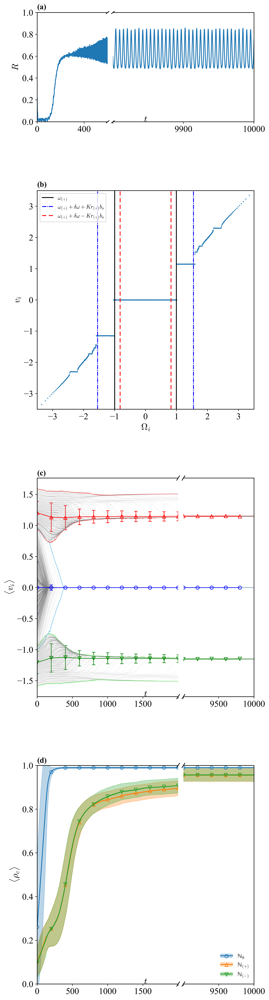

In [ ]:
import matplotlib.pyplot as plt

# ===== 공통 설정 =====
LEFT_XLIM   = (0, 600)
RIGHT_XLIM  = (9800, 10000)
WIDTH_RATIOS_BROKEN = [2, 1]   # broken x에서 왼쪽:오른쪽 축 폭 비
WSPACE_BROKEN = 0.05
SLASH_SIZE  = 0.010
SLASH_WIDTH = 1.2
SLASH_COLOR = 'k'

def add_break(axL, axR, d=SLASH_SIZE, lw=SLASH_WIDTH, color=SLASH_COLOR,w_r=WIDTH_RATIOS_BROKEN):
    """좌/우 축에 // 표시 및 경계 스파인 정리"""
    axL.spines['right'].set_visible(False)
    axR.spines['left'].set_visible(False)
    axL.yaxis.tick_left()
    axR.yaxis.tick_right()
    kw = dict(clip_on=False, color=color, linewidth=lw)
    axL.plot((1-d*w_r[1], 1+d*w_r[1]), (-d, +d), transform=axL.transAxes, **kw)
    axL.plot((1-d*w_r[1], 1+d*w_r[1]), (1-d, 1+d), transform=axL.transAxes, **kw)
    axR.plot((-d*w_r[0], +d*w_r[0]), (-d, +d), transform=axR.transAxes, **kw)
    axR.plot((-d*w_r[0], +d*w_r[0]), (1-d, 1+d), transform=axR.transAxes, **kw)

# ===== 바깥 레이아웃: (행 2) x (열 3) =====
fig = plt.figure(figsize=(7, 9/2*(1+2+2+2)), dpi=500)
outer = fig.add_gridspec(
    nrows=4, ncols=1,
    height_ratios=[1, 2,2,2],            # 왼쪽열 (a):(b)=1:2
    wspace=0.28, hspace=0.36
)

# ---------- (a) : 왼쪽열-위, R(t), broken x ----------

LEFT_XLIM   = (0, 600)
RIGHT_XLIM  = (9800, 10000)
WIDTH_RATIOS_BROKEN = [1, 2]   # broken x에서 왼쪽:오른쪽 축 폭 비
gs_a = outer[0,0].subgridspec(1, 2, width_ratios=WIDTH_RATIOS_BROKEN, wspace=WSPACE_BROKEN)
ax_aL = fig.add_subplot(gs_a[0,0])
ax_aR = fig.add_subplot(gs_a[0,1])
ax_aL.set_xlim(*LEFT_XLIM);  ax_aR.set_xlim(*RIGHT_XLIM)
ax_aL.set_ylim(0,1);ax_aR.set_ylim(0,1)
ax_aL.set_xticks([0,400]); ax_aL.set_xticklabels([0,400])
ax_aR.set_xticks([9800,9900,10000]); ax_aR.set_xticklabels(["",9900,10000])
ax_aR.set_yticks([])
add_break(ax_aL, ax_aR, w_r=[1,2])

# (a) 데이터
ax_aL.plot(t, rs); ax_aR.plot(t, rs)
ax_aL.set_ylim(0,1)
ax_aL.set_ylabel(r"$R$", fontsize=16)
ax_aL.text(0.0, 1.015, '(a)', transform=ax_aL.transAxes, fontsize=14, fontweight='bold',
           va='bottom', ha='left')

# ---------- (b) : 왼쪽열-아래, v_i vs Ω_i ----------

LEFT_XLIM   = (0, 2000)
RIGHT_XLIM  = (9000, 10000)
WIDTH_RATIOS_BROKEN = [2, 1]   # broken x에서 왼쪽:오른쪽 축 폭 비
ax_b = fig.add_subplot(outer[1,0])

# (b) 데이터
idx = -100
ax_b.axvline(OPS[idx],  color='k', label=r'$\omega_{(+)}$')
ax_b.axvline(-OPS[idx], color='k')
ax_b.axvline(OPS[idx]+dps[idx]+opp[idx], color='b', linestyle=(0,(5,1,1,1)),
             label=r'$\omega_{(+)}+\delta\omega+Kr_{(+)}b_s$')
ax_b.axvline(OPS[idx]+dps[idx]-opp[idx], color='r', linestyle=(0,(5,3)),
             label=r'$\omega_{(+)}+\delta\omega-Kr_{(+)}b_s$')
ax_b.axvline(-(OPS[idx]+dps[idx]+opp[idx]), color='b', linestyle=(0,(5,1,1,1)))
ax_b.axvline(-(OPS[idx]+dps[idx]-opp[idx]), color='r', linestyle=(0,(5,3)))
ax_b.scatter(omega, avg_dtheta[idx], s=0.8)
ax_b.set_xlim(-3.5, 3.5); ax_b.set_ylim(-3.5, 3.5)
ax_b.set_xlabel(r'$\Omega_i$', fontsize=16); ax_b.set_ylabel(r'$v_i$', fontsize=16)
ax_b.legend(fontsize=10, ncol=1, loc='upper left', frameon=True)
ax_b.text(0.0, 1.01, '(b)', transform=ax_b.transAxes, fontsize=14, fontweight='bold',
          va='bottom', ha='left')

# ---------- (c) : 가운데열(두 행 span), <v_i>, broken x ----------
gs_c = outer[2,0].subgridspec(1, 2, width_ratios=WIDTH_RATIOS_BROKEN, wspace=WSPACE_BROKEN)
ax_cL = fig.add_subplot(gs_c[0,0])
ax_cR = fig.add_subplot(gs_c[0,1])
ax_cL.set_xlim(*LEFT_XLIM);  ax_cR.set_xlim(*RIGHT_XLIM)
ax_cL.set_xticks([0,500,1000,1500,2000]); ax_cL.set_xticklabels([0,500,1000,1500,""])
ax_cR.set_xticks([9000,9500,10000]); ax_cR.set_xticklabels(["",9500,10000])
ax_cR.set_yticks([])
add_break(ax_cL, ax_cR)

# (c) 데이터
ax_cL.errorbar(t[:-s_lang:2000], m_v_0[::2000], yerr=std_v_0[::2000],
               color='b', lw=1, capsize=3, marker='o', fillstyle='none')
ax_cL.errorbar(t[:-s_lang:2000], m_v_p[::2000], yerr=std_v_p[::2000],
               color='r', lw=1, capsize=3, marker='^', fillstyle='none')
ax_cL.errorbar(t[:-s_lang:2000], m_v_m[::2000], yerr=std_v_m[::2000],
               color='g', lw=1, capsize=3, marker='v', fillstyle='none')
ax_cL.plot(t[:-s_lang], max_v_0, color='skyblue',   lw=1)
ax_cL.plot(t[:-s_lang], max_v_p, color='lightcoral',lw=1)
ax_cL.plot(t[:-s_lang], max_v_m, color='lightgreen',lw=1)
ax_cL.plot(t[:-s_lang], min_v_0, color='skyblue',   lw=1)
ax_cL.plot(t[:-s_lang], min_v_p, color='lightcoral',lw=1)
ax_cL.plot(t[:-s_lang], min_v_m, color='lightgreen',lw=1)
ax_cL.plot(t[:-s_lang], avg_dtheta[:, c_0],  c='grey', alpha=0.1, lw=0.2)
ax_cL.plot(t[:-s_lang], avg_dtheta[:, c_p0], c='grey', alpha=0.1, lw=0.2)
ax_cL.plot(t[:-s_lang], avg_dtheta[:, c_m0], c='grey', alpha=0.1, lw=0.2)

ax_cR.errorbar(t[:-s_lang:2000], m_v_0[::2000], yerr=std_v_0[::2000],
               color='b', lw=1, capsize=3, marker='o', fillstyle='none')
ax_cR.errorbar(t[:-s_lang:2000], m_v_p[::2000], yerr=std_v_p[::2000],
               color='r', lw=1, capsize=3, marker='^', fillstyle='none')
ax_cR.errorbar(t[:-s_lang:2000], m_v_m[::2000], yerr=std_v_m[::2000],
               color='g', lw=1, capsize=3, marker='v', fillstyle='none')
ax_cR.plot(t[:-s_lang], max_v_0, color='skyblue',   lw=1)
ax_cR.plot(t[:-s_lang], max_v_p, color='lightcoral',lw=1)
ax_cR.plot(t[:-s_lang], max_v_m, color='lightgreen',lw=1)
ax_cR.plot(t[:-s_lang], min_v_0, color='skyblue',   lw=1)
ax_cR.plot(t[:-s_lang], min_v_p, color='lightcoral',lw=1)
ax_cR.plot(t[:-s_lang], min_v_m, color='lightgreen',lw=1)
ax_cR.plot(t[:-s_lang], avg_dtheta[:, c_0],  c='grey', alpha=0.1, lw=0.2)
ax_cR.plot(t[:-s_lang], avg_dtheta[:, c_p0], c='grey', alpha=0.1, lw=0.2)
ax_cR.plot(t[:-s_lang], avg_dtheta[:, c_m0], c='grey', alpha=0.1, lw=0.2)

ax_cL.set_ylabel(r"$\langle v_i \rangle$", fontsize=16)
ax_cL.text(0.0, 1.005, '(c)', transform=ax_cL.transAxes, fontsize=14, fontweight='bold',
           va='bottom', ha='left')

# ---------- (d) : 오른쪽열(두 행 span), <rho_c>, broken x ----------
gs_d = outer[3,0].subgridspec(1, 2, width_ratios=WIDTH_RATIOS_BROKEN, wspace=WSPACE_BROKEN)
ax_dL = fig.add_subplot(gs_d[0,0])
ax_dR = fig.add_subplot(gs_d[0,1])
ax_dL.set_xlim(*LEFT_XLIM);  ax_dR.set_xlim(*RIGHT_XLIM)
ax_dL.set_xticks([0,500,1000,1500,2000]); ax_dL.set_xticklabels([0,500,1000,1500,""])
ax_dR.set_xticks([9000,9500,10000]); ax_dR.set_xticklabels(["",9500,10000])
ax_dR.set_yticks([])
ax_dL.set_ylim(0,1);ax_dR.set_ylim(0,1)
add_break(ax_dL, ax_dR)

# (d) 데이터
l0, = ax_dL.plot(t[:-s_lang], rho_m_0)
lp, = ax_dL.plot(t[:-s_lang], rho_m_p)
lm, = ax_dL.plot(t[:-s_lang], rho_m_m)
ax_dL.fill_between(t[:-s_lang], rho_m_0-std_m_0, rho_m_0+std_m_0, color=l0.get_color(), alpha=0.3)
ax_dL.fill_between(t[:-s_lang], rho_m_p-std_m_p, rho_m_p+std_m_p, color=lp.get_color(), alpha=0.3)
ax_dL.fill_between(t[:-s_lang], rho_m_m-std_m_m, rho_m_m+std_m_m, color=lm.get_color(), alpha=0.3)
ax_dL.scatter(t[:-s_lang:2000], rho_m_0[::2000], marker='o', facecolors='none', color=l0.get_color())
ax_dL.scatter(t[:-s_lang:2000], rho_m_p[::2000], marker='^', facecolors='none', color=lp.get_color())
ax_dL.scatter(t[:-s_lang:2000], rho_m_m[::2000], marker='v', facecolors='none', color=lm.get_color())

l0R, = ax_dR.plot(t[:-s_lang], rho_m_0)
lpR, = ax_dR.plot(t[:-s_lang], rho_m_p)
lmR, = ax_dR.plot(t[:-s_lang], rho_m_m)
b0 = ax_dR.fill_between(t[:-s_lang], rho_m_0-std_m_0, rho_m_0+std_m_0, alpha=0.3)
bp = ax_dR.fill_between(t[:-s_lang], rho_m_p-std_m_p, rho_m_p+std_m_p, alpha=0.3)
bm = ax_dR.fill_between(t[:-s_lang], rho_m_m-std_m_m, rho_m_m+std_m_m, alpha=0.3)
s0 = ax_dR.scatter(t[:-s_lang:2000], rho_m_0[::2000], marker='o', facecolors='none', color=l0R.get_color())
sp = ax_dR.scatter(t[:-s_lang:2000], rho_m_p[::2000], marker='^', facecolors='none', color=lpR.get_color())
sm = ax_dR.scatter(t[:-s_lang:2000], rho_m_m[::2000], marker='v', facecolors='none', color=lmR.get_color())

ax_dL.set_ylim(0,1); ax_dR.set_ylim(0,1)
ax_dR.legend([(l0R,b0,s0),(lpR,bp,sp),(lmR,bm,sm)],
             [r'$\rm{\mathbb{N}}_0$',r'$\rm{\mathbb{N}}_{(+)}$',r'$\rm{\mathbb{N}}_{(-)}$'],
             loc='lower right', fontsize=11, frameon=False)
ax_dL.set_ylabel(r"$\langle \rho_c \rangle$", fontsize=16)
ax_dL.text(0.0, 1.005, '(d)', transform=ax_dL.transAxes, fontsize=14, fontweight='bold',
           va='bottom', ha='left')

# ----- 공통 x 라벨 -----
# (a) 축 사이 아래쪽 중앙에 t 라벨
fig.text((ax_aL.get_position().x0 + ax_aR.get_position().x1)/2,
         ax_aL.get_position().y0, r"$t$", ha="center", fontsize=16)

# (c)
fig.text((ax_cL.get_position().x0 + ax_cR.get_position().x1)/2,
         ax_cL.get_position().y0, r"$t$", ha="center", fontsize=16)

# (d)
fig.text((ax_dL.get_position().x0 + ax_dR.get_position().x1)/2,
         ax_dL.get_position().y0, r"$t$", ha="center", fontsize=16)
# plt.savefig("fig1 ver1.pdf", dpi=300)
plt.show()


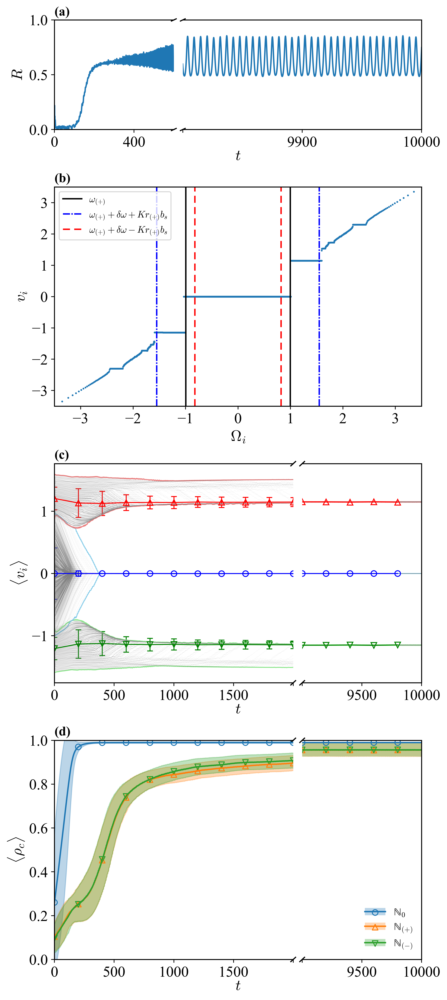

In [ ]:
#| label: fig:paper_fig_1_ver2
#| caption: 논문용 그림 2. $N = 5000, K = 6, m = 6, t_{end} = 10000$으로 시뮬레이션 한 결과 (세로 배열 버전)
import matplotlib.pyplot as plt

# ===== 공통 설정 =====
LEFT_XLIM   = (0, 600)
RIGHT_XLIM  = (9800, 10000)
WIDTH_RATIOS_BROKEN = [2, 1]   # broken x에서 왼쪽:오른쪽 축 폭 비
WSPACE_BROKEN = 0.05
SLASH_SIZE  = 0.010
SLASH_WIDTH = 1.2
SLASH_COLOR = 'k'

def add_break(axL, axR, d=SLASH_SIZE, lw=SLASH_WIDTH, color=SLASH_COLOR,w_r=WIDTH_RATIOS_BROKEN):
    """좌/우 축에 // 표시 및 경계 스파인 정리"""
    axL.spines['right'].set_visible(False)
    axR.spines['left'].set_visible(False)
    axL.yaxis.tick_left()
    axR.yaxis.tick_right()
    kw = dict(clip_on=False, color=color, linewidth=lw)
    axL.plot((1-d*w_r[1], 1+d*w_r[1]), (-d, +d), transform=axL.transAxes, **kw)
    axL.plot((1-d*w_r[1], 1+d*w_r[1]), (1-d, 1+d), transform=axL.transAxes, **kw)
    axR.plot((-d*w_r[0], +d*w_r[0]), (-d, +d), transform=axR.transAxes, **kw)
    axR.plot((-d*w_r[0], +d*w_r[0]), (1-d, 1+d), transform=axR.transAxes, **kw)

# ===== 바깥 레이아웃: (행 2) x (열 3) =====
fig = plt.figure(figsize=(7, 9/2*(1+3)), dpi=500)
outer = fig.add_gridspec(
    nrows=4, ncols=1,
    height_ratios=[1, 2,2,2],            # 왼쪽열 (a):(b)=1:2
    wspace=0.28, hspace=0.30
)

# ---------- (a) : 왼쪽열-위, R(t), broken x ----------

LEFT_XLIM   = (0, 600)
RIGHT_XLIM  = (9800, 10000)
WIDTH_RATIOS_BROKEN = [1, 2]   # broken x에서 왼쪽:오른쪽 축 폭 비
gs_a = outer[0,0].subgridspec(1, 2, width_ratios=WIDTH_RATIOS_BROKEN, wspace=WSPACE_BROKEN)
ax_aL = fig.add_subplot(gs_a[0,0])
ax_aR = fig.add_subplot(gs_a[0,1])
ax_aL.set_xlim(*LEFT_XLIM);  ax_aR.set_xlim(*RIGHT_XLIM)
ax_aL.set_ylim(0,1);ax_aR.set_ylim(0,1)
ax_aL.set_xticks([0,400]); ax_aL.set_xticklabels([0,400])
ax_aR.set_xticks([9800,9900,10000]); ax_aR.set_xticklabels(["",9900,10000])
ax_aR.set_yticks([])
add_break(ax_aL, ax_aR, w_r=[1,2])

# (a) 데이터
ax_aL.plot(t, rs); ax_aR.plot(t, rs)
ax_aL.set_ylim(0,1)
ax_aL.set_ylabel(r"$R$", fontsize=16)
ax_aL.text(0.0, 1.015, '(a)', transform=ax_aL.transAxes, fontsize=14, fontweight='bold',
           va='bottom', ha='left')

# ---------- (b) : 왼쪽열-아래, v_i vs Ω_i ----------

LEFT_XLIM   = (0, 2000)
RIGHT_XLIM  = (9000, 10000)
WIDTH_RATIOS_BROKEN = [2, 1]   # broken x에서 왼쪽:오른쪽 축 폭 비
ax_b = fig.add_subplot(outer[1,0])

# (b) 데이터
idx = -100
ax_b.axvline(OPS[idx],  color='k', label=r'$\omega_{(+)}$')
ax_b.axvline(-OPS[idx], color='k')
ax_b.axvline(OPS[idx]+dps[idx]+opp[idx], color='b', linestyle=(0,(5,1,1,1)),
             label=r'$\omega_{(+)}+\delta\omega+Kr_{(+)}b_s$')
ax_b.axvline(OPS[idx]+dps[idx]-opp[idx], color='r', linestyle=(0,(5,3)),
             label=r'$\omega_{(+)}+\delta\omega-Kr_{(+)}b_s$')
ax_b.axvline(-(OPS[idx]+dps[idx]+opp[idx]), color='b', linestyle=(0,(5,1,1,1)))
ax_b.axvline(-(OPS[idx]+dps[idx]-opp[idx]), color='r', linestyle=(0,(5,3)))
ax_b.scatter(omega, avg_dtheta[idx], s=0.8)
ax_b.set_xlim(-3.5, 3.5); ax_b.set_ylim(-3.5, 3.5)
ax_b.set_xlabel(r'$\Omega_i$', fontsize=16); ax_b.set_ylabel(r'$v_i$', fontsize=16)
ax_b.legend(fontsize=10, ncol=1, loc='upper left', frameon=True)
ax_b.text(0.0, 1.01, '(b)', transform=ax_b.transAxes, fontsize=14, fontweight='bold',
          va='bottom', ha='left')

# ---------- (c) : 가운데열(두 행 span), <v_i>, broken x ----------
gs_c = outer[2,0].subgridspec(1, 2, width_ratios=WIDTH_RATIOS_BROKEN, wspace=WSPACE_BROKEN)
ax_cL = fig.add_subplot(gs_c[0,0])
ax_cR = fig.add_subplot(gs_c[0,1])
ax_cL.set_xlim(*LEFT_XLIM);  ax_cR.set_xlim(*RIGHT_XLIM)
ax_cL.set_xticks([0,500,1000,1500,2000]); ax_cL.set_xticklabels([0,500,1000,1500,""])
ax_cR.set_xticks([9000,9500,10000]); ax_cR.set_xticklabels(["",9500,10000])
ax_cR.set_yticks([])
add_break(ax_cL, ax_cR)

# (c) 데이터
ax_cL.errorbar(t[:-s_lang:2000], m_v_0[::2000], yerr=std_v_0[::2000],
               color='b', lw=1, capsize=3, marker='o', fillstyle='none')
ax_cL.errorbar(t[:-s_lang:2000], m_v_p[::2000], yerr=std_v_p[::2000],
               color='r', lw=1, capsize=3, marker='^', fillstyle='none')
ax_cL.errorbar(t[:-s_lang:2000], m_v_m[::2000], yerr=std_v_m[::2000],
               color='g', lw=1, capsize=3, marker='v', fillstyle='none')
ax_cL.plot(t[:-s_lang], max_v_0, color='skyblue',   lw=1)
ax_cL.plot(t[:-s_lang], max_v_p, color='lightcoral',lw=1)
ax_cL.plot(t[:-s_lang], max_v_m, color='lightgreen',lw=1)
ax_cL.plot(t[:-s_lang], min_v_0, color='skyblue',   lw=1)
ax_cL.plot(t[:-s_lang], min_v_p, color='lightcoral',lw=1)
ax_cL.plot(t[:-s_lang], min_v_m, color='lightgreen',lw=1)
ax_cL.plot(t[:-s_lang], avg_dtheta[:, c_0],  c='grey', alpha=0.1, lw=0.2)
ax_cL.plot(t[:-s_lang], avg_dtheta[:, c_p0], c='grey', alpha=0.1, lw=0.2)
ax_cL.plot(t[:-s_lang], avg_dtheta[:, c_m0], c='grey', alpha=0.1, lw=0.2)

ax_cR.errorbar(t[:-s_lang:2000], m_v_0[::2000], yerr=std_v_0[::2000],
               color='b', lw=1, capsize=3, marker='o', fillstyle='none')
ax_cR.errorbar(t[:-s_lang:2000], m_v_p[::2000], yerr=std_v_p[::2000],
               color='r', lw=1, capsize=3, marker='^', fillstyle='none')
ax_cR.errorbar(t[:-s_lang:2000], m_v_m[::2000], yerr=std_v_m[::2000],
               color='g', lw=1, capsize=3, marker='v', fillstyle='none')
ax_cR.plot(t[:-s_lang], max_v_0, color='skyblue',   lw=1)
ax_cR.plot(t[:-s_lang], max_v_p, color='lightcoral',lw=1)
ax_cR.plot(t[:-s_lang], max_v_m, color='lightgreen',lw=1)
ax_cR.plot(t[:-s_lang], min_v_0, color='skyblue',   lw=1)
ax_cR.plot(t[:-s_lang], min_v_p, color='lightcoral',lw=1)
ax_cR.plot(t[:-s_lang], min_v_m, color='lightgreen',lw=1)
ax_cR.plot(t[:-s_lang], avg_dtheta[:, c_0],  c='grey', alpha=0.1, lw=0.2)
ax_cR.plot(t[:-s_lang], avg_dtheta[:, c_p0], c='grey', alpha=0.1, lw=0.2)
ax_cR.plot(t[:-s_lang], avg_dtheta[:, c_m0], c='grey', alpha=0.1, lw=0.2)

ax_cL.set_ylabel(r"$\langle v_i \rangle$", fontsize=16)
ax_cL.text(0.0, 1.01, '(c)', transform=ax_cL.transAxes, fontsize=14, fontweight='bold',
           va='bottom', ha='left')

# ---------- (d) : 오른쪽열(두 행 span), <rho_c>, broken x ----------
gs_d = outer[3,0].subgridspec(1, 2, width_ratios=WIDTH_RATIOS_BROKEN, wspace=WSPACE_BROKEN)
ax_dL = fig.add_subplot(gs_d[0,0])
ax_dR = fig.add_subplot(gs_d[0,1])
ax_dL.set_xlim(*LEFT_XLIM);  ax_dR.set_xlim(*RIGHT_XLIM)
ax_dL.set_xticks([0,500,1000,1500,2000]); ax_dL.set_xticklabels([0,500,1000,1500,""])
ax_dR.set_xticks([9000,9500,10000]); ax_dR.set_xticklabels(["",9500,10000])
ax_dR.set_yticks([])
ax_dL.set_ylim(0,1);ax_dR.set_ylim(0,1)
add_break(ax_dL, ax_dR)

# (d) 데이터
l0, = ax_dL.plot(t[:-s_lang], rho_m_0)
lp, = ax_dL.plot(t[:-s_lang], rho_m_p)
lm, = ax_dL.plot(t[:-s_lang], rho_m_m)
ax_dL.fill_between(t[:-s_lang], rho_m_0-std_m_0, rho_m_0+std_m_0, color=l0.get_color(), alpha=0.3)
ax_dL.fill_between(t[:-s_lang], rho_m_p-std_m_p, rho_m_p+std_m_p, color=lp.get_color(), alpha=0.3)
ax_dL.fill_between(t[:-s_lang], rho_m_m-std_m_m, rho_m_m+std_m_m, color=lm.get_color(), alpha=0.3)
ax_dL.scatter(t[:-s_lang:2000], rho_m_0[::2000], marker='o', facecolors='none', color=l0.get_color())
ax_dL.scatter(t[:-s_lang:2000], rho_m_p[::2000], marker='^', facecolors='none', color=lp.get_color())
ax_dL.scatter(t[:-s_lang:2000], rho_m_m[::2000], marker='v', facecolors='none', color=lm.get_color())

l0R, = ax_dR.plot(t[:-s_lang], rho_m_0)
lpR, = ax_dR.plot(t[:-s_lang], rho_m_p)
lmR, = ax_dR.plot(t[:-s_lang], rho_m_m)
b0 = ax_dR.fill_between(t[:-s_lang], rho_m_0-std_m_0, rho_m_0+std_m_0, alpha=0.3)
bp = ax_dR.fill_between(t[:-s_lang], rho_m_p-std_m_p, rho_m_p+std_m_p, alpha=0.3)
bm = ax_dR.fill_between(t[:-s_lang], rho_m_m-std_m_m, rho_m_m+std_m_m, alpha=0.3)
s0 = ax_dR.scatter(t[:-s_lang:2000], rho_m_0[::2000], marker='o', facecolors='none', color=l0R.get_color())
sp = ax_dR.scatter(t[:-s_lang:2000], rho_m_p[::2000], marker='^', facecolors='none', color=lpR.get_color())
sm = ax_dR.scatter(t[:-s_lang:2000], rho_m_m[::2000], marker='v', facecolors='none', color=lmR.get_color())

ax_dL.set_ylim(0,1); ax_dR.set_ylim(0,1)
ax_dR.legend([(l0R,b0,s0),(lpR,bp,sp),(lmR,bm,sm)],
             [r'$\rm{\mathbb{N}}_0$',r'$\rm{\mathbb{N}}_{(+)}$',r'$\rm{\mathbb{N}}_{(-)}$'],
             loc='lower right', fontsize=11, frameon=False)
ax_dL.set_ylabel(r"$\langle \rho_c \rangle$", fontsize=16)
ax_dL.text(0.0, 1.01, '(d)', transform=ax_dL.transAxes, fontsize=14, fontweight='bold',
           va='bottom', ha='left')

# ----- 공통 x 라벨 -----
# (a) 축 사이 아래쪽 중앙에 t 라벨
fig.text((ax_aL.get_position().x0 + ax_aR.get_position().x1)/2,
         ax_aL.get_position().y0-0.025, r"$t$", ha="center", fontsize=16)

# (c)
fig.text((ax_cL.get_position().x0 + ax_cR.get_position().x1)/2,
         ax_cL.get_position().y0-0.025, r"$t$", ha="center", fontsize=16)

# (d)
fig.text((ax_dL.get_position().x0 + ax_dR.get_position().x1)/2,
         ax_dL.get_position().y0-0.025, r"$t$", ha="center", fontsize=16)
# plt.savefig("fig1 ver1.pdf", dpi=300)
plt.show()


# FIG 2

In [27]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import matplotlib
import matplotlib.colors as mcl
from matplotlib.patches import Rectangle
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [5]:
import numpy as np
import matplotlib.pyplot as plt

def pij_at_index(theta, s_lang, idx, step=100, tmax=30000, cmap='viridis'):
	"""
	theta : (T_full, N)  실수 각도 배열
	s_lang: 기존 코드의 윈도우 길이 변수
	idx   : 출력할 윈도우 시작 인덱스 (subsampled 시계열 기준)
	step  : 서브샘플 간격 (예: 100)
	tmax  : theta에서 앞쪽만 쓸 때 (예: 30000)
	"""
	# 1) 서브샘플링 (당신 코드와 동일)
	sum_theta = theta[:tmax:step]             # (T, N)
	T, N = sum_theta.shape

	L = s_lang // step                        # 윈도우 길이
	if not (0 <= idx <= T - L):
		raise ValueError(f"idx는 0~{T-L} 사이여야 합니다. (지금 idx={idx}, T={T}, L={L})")

	# 2) 해당 idx의 윈도우 구간만 준비 (L x N)
	#    바로 복소 편각으로 변환해서 행렬곱 한번에 처리
	z = np.exp(1j * sum_theta[idx:idx+L], dtype=np.complex64)  # (L, N)
	r_btw = rs[idx:idx+L]
	rm = np.mean(r_btw)
	rstd = np.std(r_btw)
	# 3) S = sum z_t z_t^H  ==  z^H z  (N x N)
	S = (z.conj().T @ z).astype(np.complex64)                  # (N, N)

	# 4) 평균 크기 구해 그림 그리기용 (float32)
	P = (np.abs(S) / L).astype(np.float32)                     # (N, N)
	return P, rm, rstd


In [6]:
colors = ['black', '#FF10F0','cyan']

In [7]:
s_lang = 2000
v_t = (theta[-1] - theta[-s_lang])/(t[-1]-t[-s_lang])
con0 = np.abs(v_t - v_t[N//2]) < 0.15
c_0, = np.where(con0)
c_s = {}
c_s['0'] = c_0
c_p, = np.where(np.logical_and(~con0, omega > 0))
c_m, = np.where(np.logical_and(~con0, omega < 0))
if len(c_p) > 0:
	conp = np.abs(v_t - np.min(v_t[c_p])) < 0.02
	c_p0, = np.where(conp)
	c_s['+'] = c_p
	if len(c_p0) > 0:
		c_s['+l'] = c_p0
if len(c_m) > 0:
	conm = np.abs(v_t - np.max(v_t[c_m])) < 0.02
	c_m0, = np.where(conm)
	c_s['-'] = c_m
	if len(c_m0) > 0:
		c_s['-l'] = c_m0

In [8]:
rstd_set =[]
rmean_set =[]
for i in range(len(theta)-s_lang):
    r_btw = rs[i:i+s_lang]
    rmean_set.append(np.mean(r_btw))
    rstd_set.append(np.std(r_btw))
rstd_set = np.array(rstd_set)
rmean_set = np.array(rmean_set)


In [30]:
np.argsort(rstd_set)[:100]

array([2043, 2042, 2044, 2041, 2040, 2045, 2039, 2046, 2038, 2116, 2115,
       2117, 2114, 2118, 2113, 2112, 2119, 2037, 2111, 2110, 2047, 2109,
       2120, 2108, 2036, 2107, 2106, 2105, 2104, 2121, 2035, 2103, 2102,
       2048, 2101, 2100, 2034, 2099, 2122, 2098, 2097, 2187, 2033, 2188,
       2186, 2096, 2185, 2189, 2095, 2184, 2049, 2123, 2190, 2094, 2183,
       2032, 2093, 2191, 2182, 2092, 2091, 2181, 2090, 2031, 2192, 2089,
       2124, 2180, 2088, 2087, 2050, 2179, 2030, 2086, 2193, 2085, 2178,
       2084, 2029, 2125, 2083, 2177, 2082, 2194, 2081, 2028, 2176, 2051,
       2080, 2175, 2126, 2079, 2027, 2195, 2174, 2078, 2026, 2077, 2173,
       2127], dtype=int64)

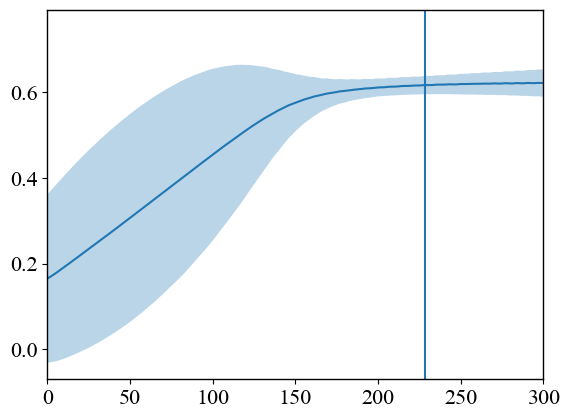

In [31]:
plt.plot(t[:-s_lang],rmean_set)
plt.fill_between(t[:-s_lang],rmean_set-rstd_set,rmean_set+rstd_set,alpha=0.3)
plt.xlim(0,300)
plt.axvline(t[2282])

In [161]:
def Draw_pij(idx,ax,c_id):
	P_idx,rm_idx,rstd_idx = pij_at_index(theta, s_lang=s_lang, idx=idx, step=1, tmax=100*1000)
	# P_idx = np.ones((N,N))
	im = ax.imshow(P_idx,origin='lower')
	ax.set_xticks([])
	ax.set_yticks([])


	RECs = []
	for clu,color in zip([c_0,c_p0,c_m0],colors):
			if len(clu)!=0:
				min_c,max_c = np.max(clu),np.min(clu)
				Rec_ = plt.Rectangle((min_c+1,min_c+1),max_c-min_c,max_c-min_c,fill=False, edgecolor='k', linewidth=0.5)
				Rec = plt.Rectangle((min_c+1,min_c+1),max_c-min_c,max_c-min_c,fill=False, edgecolor=color, linewidth=1.5)
				RECs.append((Rec_,Rec))
				ax.add_patch(Rec_)
				ax.add_patch(Rec)


	ax.text(0.0, 1.01, rf'({c_id}) $t$ = {idx/10:.1f}', transform=ax.transAxes, fontsize=20, fontweight='bold',
			va='bottom', ha='left')
	divider2 = make_axes_locatable(ax)
	cax = divider2.append_axes("bottom", size="3%", pad=0.05)

	pos = ax.get_position()  # [x0, y0, width, height]
	rstd_bar = fig.add_axes([pos.x1-0.04, pos.y0 - 0.0006, 0.015, pos.height * 1.003])
	#                  ↑x0       ↑y0       ↑width  ↑height
	#                    └─ 살짝 오른쪽, 아래로 내리고, 길이 1.2배로

	# colorbar 생성
	# rstd_bar = divider2.append_axes("right", size="5%", pad=0.05,clip_on=True)
	# pos = rstd_bar.get_position()
	# new_pos = [pos.x0, pos.y0 - 1, pos.width, pos.height * 1.2]
	# rstd_bar.set_position(new_pos)
	rstd_bar.set_yticks([])
	rstd_bar.set_xticks([])
	rax = rstd_bar.twinx()
	err =rax.errorbar(0.5,rm_idx,rstd_idx,
				fmt='.',color ='tab:red',zorder=2,capsize=4,elinewidth=2,capthick=3,ms=10,)
	# rax.scatter(0.5,rmean_set[time_],color='red',marker='d',zorder=1)
	rax.set_ylim(0,1)
	rstd_bar.set_title(r'$\langle$$R$$\rangle$$_t$',fontsize=14)
	plt.sca(rax)
	plt.yticks(fontsize=13)
		# cax.axis('off')
	colorbar = fig.colorbar(im, cax=cax, orientation="horizontal")
	colorbar.set_ticks([0,1])
	plt.sca(cax)
	plt.xticks(fontsize=13)

	colorbar.set_label(r'$P_{ij}$',fontsize=18,labelpad=-10)

In [106]:
rpsi = 1/N * np.sum(np.exp(1j*theta),axis=1)
rs = np.abs(rpsi)
psi = np.angle(rpsi)

n_dtheta1 = (dtheta)/ np.max(abs(dtheta))

def time_oscillator1(i):
    norm = n_dtheta1[i]
    A = (1 + (norm)/2)
    theta_ = theta[i]-psi[i]#-psi_clu[0][i]
    # theta_ = theta[i]-psiP[i]#theta[i,max(cluster[0])+1]#-psi_clu[0][i]
    sin,cos = A*np.sin(theta_+np.pi/2), A*np.cos(theta_+np.pi/2)
    
    return cos,sin,norm,np.cos(theta_+np.pi/2),np.sin(theta_+np.pi/2)
not_CLU = np.setdiff1d(np.arange(N),np.concatenate(list([c_0,c_p0,c_m0])))
c_ = np.linspace(-np.pi,np.pi,1000)
circle = {
    'x': np.cos(c_),'y':np.sin(c_)
}

markers = ['o','^','v']

In [107]:
def Draw_circle(idx,ax,label=False,c_idx=''):
	plt.sca(ax)
	# colors = ['gold','darkslateblue','darkred']
	# idx = 0
	X,Y,C_,x,y = time_oscillator1(idx)
	ax.plot([0,np.mean(x)],[0,np.mean(y)],color='black',lw=3,marker='o',zorder=3)
	ax.text(np.mean(x)/2,np.mean(y)/2,' '+r'$R$',horizontalalignment='left', verticalalignment='center',fontsize=15)
	cmap = 'coolwarm'#'Spectral'#'viridis'#
	s = 100
	data = {
		'x': X[not_CLU],'y':Y[not_CLU],
		'c': omega[not_CLU],'s':30,'vmax':2,'vmin':-2,'alpha':0.3,
		'cmap':cmap,'marker':'x'
		# 'c': colors,#omega_nc,'cmap':'YlOrRd',
	}
	cax_ = ax.scatter(**data,zorder=1)
	alpha = 1
	alpha_text = f'{round(alpha*255):02x}'
	for clu,color,marker in zip([c_0,c_p0,c_m0],colors[:],markers):
		if len(clu)!=0:

			data = {
				'x': X[clu],'y':Y[clu],
				'c': omega[clu],'cmap':cmap,
				'edgecolor':(*mcl.to_rgb(color),alpha),'linewidth':1,'s':30,'vmax':2,'vmin':-2,'marker':marker}
			cax = ax.scatter(**data,zorder=1)


	ax.plot(np.cos(c_),np.sin(c_),zorder=0,color=plt.cm.coolwarm(0.5),lw=3,ls='--')
	ax.set_xlim(-1.5,1.5)
	ax.set_ylim(-1.5,1.5)
	# ax.axis('off')

	ax.set_xticks([])
	ax.set_yticks([])
	# ax.text(-1.2,1.0,'(4e)',fontsize=18*multi_)
	# ax = plt.gca()
	ax.set_aspect('equal')
	cbar2 = plt.colorbar(cax,extend='both',shrink = 0.5,orientation='horizontal',location='bottom',pad=0.01)
	# cbar2.ax.plot([0,1],[1]*2,'w')
	for clu,color in zip([c_0,c_p0,c_m0][::-1],colors[::-1]):
		if len(clu)!=0:
			height = 1.8
			min_c,max_c = np.max(omega[clu]),np.min(omega[clu])
			rect = Rectangle((min_c, -(height-1)/2), width=max_c - min_c, height=height,
					edgecolor=color, facecolor='none', lw=1.5,zorder=100,clip_on=False)

			cbar2.ax.add_patch(rect)

	cbar2.outline.set_edgecolor('gray')
	# ax.text(1.4,1.4,r'$t=t_i$',horizontalalignment='right', verticalalignment='top',fontsize=15)

	cbar2.set_label('$\Omega_i$',rotation=0,fontsize=18)

	ax.axes.xaxis.set_visible(False)
	ax.axes.yaxis.set_visible(False)
	ax.axis('off')
	ax.set_facecolor((1,1,1,0))
	ax.set_aspect('equal')

	# for ax,text in zip(axs,['(d)','(e)','(f)']):
	# ax.set_title(text,fontsize=25,loc='left')
	p0 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.5)[:3],0),edgecolors=colors[0],marker=markers[0])
	p1 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.3)[:3],0),edgecolors=colors[1],marker=markers[1])
	p2 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.7)[:3],0),edgecolors=colors[2],marker=markers[2])
	ax.text(0.0, 1.01, rf'({c_idx})', transform=ax.transAxes, fontsize=20, fontweight='bold',
			va='bottom', ha='left')
	if label:
		ax.legend([(p0),(p1),(p2)],[r'$\rm{\mathbb{N}}_0$',r'$\rm{\mathbb{N}}_{(+)}$',r'$\rm{\mathbb{N}}_{(-)}$'],loc='upper right',bbox_to_anchor=(1.2, 1.1),ncols=1,fontsize=14,frameon=False)

C:\Users\kim9y\AppData\Local\Temp\ipykernel_48088\406607992.py:63: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  p0 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.5)[:3],0),edgecolors=colors[0],marker=markers[0])
C:\Users\kim9y\AppData\Local\Temp\ipykernel_48088\406607992.py:64: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  p1 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.3)[:3],0),edgecolors=colors[1],marker=

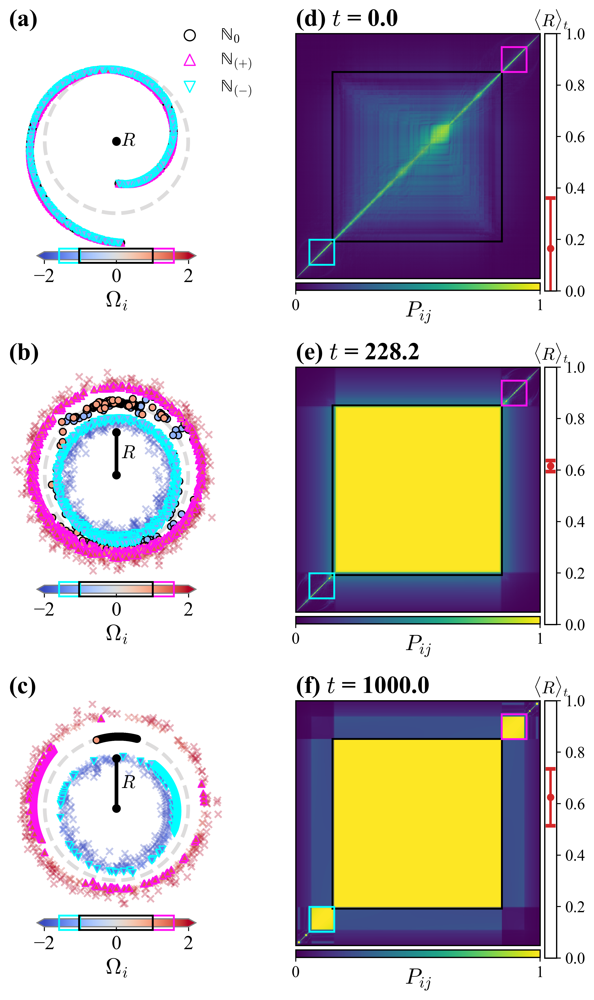

In [163]:
fig = plt.figure(figsize=(9, 9/2*(3)), dpi=500)
outer = fig.add_gridspec(
    nrows=3, ncols=2,
    height_ratios=[2, 2,2],            # 왼쪽열 (a):(b)=1:2
    wspace=-0.05, hspace=0.3
)

# ---------- (a) : 왼쪽열-위, R(t), broken x ----------

LEFT_XLIM   = (0, 600)
RIGHT_XLIM  = (9800, 10000)
WIDTH_RATIOS_BROKEN = [1, 2]   # broken x에서 왼쪽:오른쪽 축 폭 비
ax_a = fig.add_subplot(outer[0,0])
ax_b = fig.add_subplot(outer[1,0])
ax_c = fig.add_subplot(outer[2,0])
ax_d = fig.add_subplot(outer[0,1])
ax_e = fig.add_subplot(outer[1,1])
ax_f = fig.add_subplot(outer[2,1])
Draw_circle(0,ax_a,label=True,c_idx='a')
Draw_circle(2282,ax_b,label=False,c_idx='b')
Draw_circle(10000,ax_c,label=False,c_idx='c')
Draw_pij(0,ax_d,'d')
Draw_pij(2282,ax_e,'e')
Draw_pij(10000,ax_f,'f')
plt.savefig('fig2.pdf',dpi=500)
plt.show()

C:\Users\kim9y\AppData\Local\Temp\ipykernel_43044\577441025.py:68: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  p0 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.5)[:3],0),edgecolors=colors[0],marker=markers[0])
C:\Users\kim9y\AppData\Local\Temp\ipykernel_43044\577441025.py:69: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  p1 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.3)[:3],0),edgecolors=colors[1],marker=

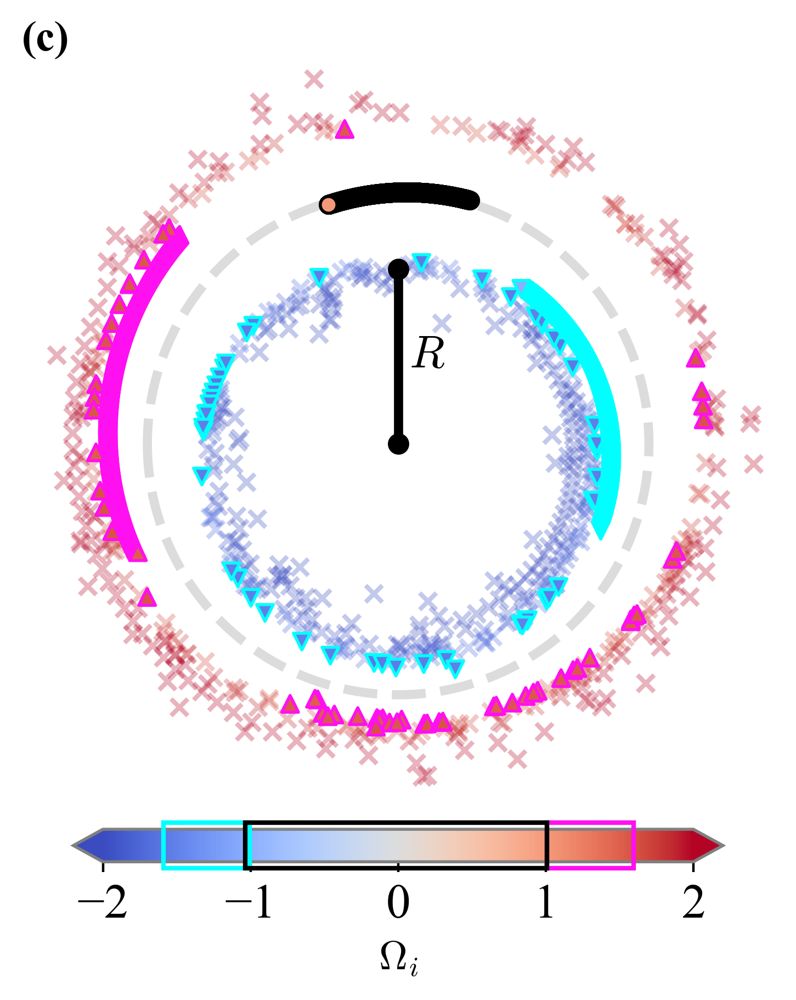

In [72]:
fig, ax = plt.subplots(1,1,dpi=400,facecolor='white')
plt.sca(ax)
# colors = ['gold','darkslateblue','darkred']
# idx = 0
X,Y,C_,x,y = time_oscillator1(idx)
ax.plot([0,np.mean(x)],[0,np.mean(y)],color='black',lw=3,marker='o',zorder=3)
ax.text(np.mean(x)/2,np.mean(y)/2,' '+r'$R$',horizontalalignment='left', verticalalignment='center',fontsize=15)
cmap = 'coolwarm'#'Spectral'#'viridis'#
s = 100
data = {
	'x': X[not_CLU],'y':Y[not_CLU],
	'c': omega[not_CLU],'s':30,'vmax':2,'vmin':-2,'alpha':0.3,
	'cmap':cmap,'marker':'x'
	# 'c': colors,#omega_nc,'cmap':'YlOrRd',
}
cax_ = ax.scatter(**data,zorder=1)
alpha = 1
alpha_text = f'{round(alpha*255):02x}'
for clu,color,marker in zip([c_0,c_p0,c_m0],colors[:],markers):
	if len(clu)!=0:

		data = {
			'x': X[clu],'y':Y[clu],
			'c': omega[clu],'cmap':cmap,
			'edgecolor':(*mcl.to_rgb(color),alpha),'linewidth':1,'s':30,'vmax':2,'vmin':-2,'marker':marker}
		cax = ax.scatter(**data,zorder=1)


ax.plot(np.cos(c_),np.sin(c_),zorder=0,color=plt.cm.coolwarm(0.5),lw=3,ls='--')
ax.set_xlim(-1.5,1.5)
ax.set_ylim(-1.5,1.5)
# ax.axis('off')

ax.set_xticks([])
ax.set_yticks([])
# ax.text(-1.2,1.0,'(4e)',fontsize=18*multi_)
plt.tight_layout()
# ax = plt.gca()
ax.set_aspect('equal')
cbar2 = plt.colorbar(cax,extend='both',shrink = 0.5,orientation='horizontal',location='bottom',pad=0.01)
# cbar2.ax.plot([0,1],[1]*2,'w')
for clu,color in zip([c_0,c_p0,c_m0][::-1],colors[::-1]):
	if len(clu)!=0:

		min_c,max_c = np.max(omega[clu]),np.min(omega[clu])
		rect = Rectangle((min_c, -0.2), width=max_c - min_c, height=1.4,
                 edgecolor=color, facecolor='none', lw=1.5,zorder=100,clip_on=False)
		# cbar2.ax.plot([min_c]*2,[0.00,1],color=color,lw=1)
		# cbar2.ax.plot([max_c]*2,[0.00,1],color=color,lw=1)
		# cbar2.ax.plot([min_c,max_c],[0.02,0.02],color=color,lw=2)
		# cbar2.ax.plot([min_c,max_c],[0.98,0.98],color=color,lw=2)
		# cbar2.ax.set_ylim(0,1)
		cbar2.ax.add_patch(rect)

cbar2.outline.set_edgecolor('gray')
# ax.text(1.4,1.4,r'$t=t_i$',horizontalalignment='right', verticalalignment='top',fontsize=15)

cbar2.set_label('$\Omega_i$',rotation=0,fontsize=13)

ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
ax.axis('off')
ax.set_facecolor((1,1,1,0))
ax.set_aspect('equal')

# for ax,text in zip(axs,['(d)','(e)','(f)']):
# ax.set_title(text,fontsize=25,loc='left')
p0 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.5)[:3],0),edgecolors=colors[0],marker=markers[0])
p1 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.3)[:3],0),edgecolors=colors[1],marker=markers[1])
p2 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.7)[:3],0),edgecolors=colors[2],marker=markers[2])
ax.text(0.0, 1.01, rf'(c)', transform=ax.transAxes, fontsize=14, fontweight='bold',
         va='bottom', ha='left')
# ax.legend([(p0),(p1),(p2)],[r'$\rm{\mathbb{N}}_0$',r'$\rm{\mathbb{N}}_{(+)}$',r'$\rm{\mathbb{N}}_{(-)}$'],loc='upper right',ncols=1,fontsize=14,frameon=False)
plt.tight_layout()
plt.show()

In [ ]:
from itertools import combinations,permutations
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

fig, axs = plt.subplots(ncols=3, nrows=1,figsize=(16,6),dpi=400,facecolor=(1,1,1,1),width_ratios=[3,3,3])
multi_ = 1.5

############################ rotator graph2 ####################
for ax,t_ in zip(axs,[0,t_arg[0],10000]):
    plt.sca(ax)
    # colors = ['gold','darkslateblue','darkred']
    X,Y,C_,x,y = time_oscillator1(t_)
    ax.plot([0,np.mean(x)],[0,np.mean(y)],color='black',lw=3,marker='o',zorder=3)
    ax.text(np.mean(x)/2,np.mean(y)/2,' '+r'$r$',horizontalalignment='left', verticalalignment='center',fontsize=15)
    cmap = 'coolwarm'#'Spectral'#'viridis'#
    s = 100
    data = {
        'x': X[not_CLU],'y':Y[not_CLU],
        'c': omega[not_CLU],'s':80,'vmax':2,'vmin':-2,'alpha':0.3,
        'cmap':cmap,
        # 'c': colors,#omega_nc,'cmap':'YlOrRd',
    }
    cax_ = ax.scatter(**data,zorder=1)
    alpha = 1
    alpha_text = f'{round(alpha*255):02x}'
    for clu,color in zip([c_0,c_p0,c_m0],colors[:]):
        if len(clu)!=0:

            data = {
                'x': X[clu],'y':Y[clu],
                'c': omega[clu],'cmap':cmap,
                'edgecolor':(*mcl.to_rgb(color),alpha),'linewidth':1,'s':80,'vmax':2,'vmin':-2}
            cax = ax.scatter(**data,zorder=1)


    ax.plot(np.cos(c_),np.sin(c_),zorder=0,color=plt.cm.coolwarm(0.5),lw=3,ls='--')
    ax.set_xlim(-1.5,1.5)
    ax.set_ylim(-1.5,1.5)
    # ax.axis('off')

    ax.set_xticks([])
    ax.set_yticks([])
    # ax.text(-1.2,1.0,'(4e)',fontsize=18*multi_)
    plt.tight_layout()
    # ax = plt.gca()
    ax.set_aspect('equal')
    cbar2 = plt.colorbar(cax,extend='both',shrink = 0.5,orientation='horizontal',location='bottom',pad=0.01)
    # cbar2.ax.plot([0,1],[1]*2,'w')
    for clu,color in zip([c_0,c_p0,c_m0],colors[:]):
        if len(clu)!=0:

            min_c,max_c = np.max(omega[clu]),np.min(omega[clu])
            cbar2.ax.plot([min_c]*2,[0,1],color=color,lw=3)
            cbar2.ax.plot([max_c]*2,[0,1],color=color,lw=3)
            cbar2.ax.plot([min_c,max_c],[0,0],color=color,lw=3)
            cbar2.ax.plot([min_c,max_c],[1,1],color=color,lw=3)

    # ax.text(1.4,1.4,r'$t=t_i$',horizontalalignment='right', verticalalignment='top',fontsize=15)

    cbar2.set_label('$\Omega_i$',rotation=0,fontsize=13)

    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)
    ax.axis('off')
    ax.set_facecolor((1,1,1,0))
    ax.set_aspect('equal')
    
# for ax,text in zip(axs,['(d)','(e)','(f)']):
    # ax.set_title(text,fontsize=25,loc='left')
p0 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.5)[:3],0),edgecolors=colors[0])
p1 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.3)[:3],0),edgecolors=colors[1])
p2 = ax.scatter(np.nan,np.nan,s=80,c=(*plt.cm.coolwarm(0.7)[:3],0),edgecolors=colors[2])

axs[0].legend([(p0),(p1),(p2)],['main cluster',r'secondary cluster $(-)$',r'secondary cluster $(+)$'],loc='upper center',ncols=1,fontsize=18)
# axs[0].legend([p0,p1,p2],['main cluster',r'secondary cluster $(-)$',r'secondary cluster $(+)$'],ncols=3)
fig.tight_layout()
# ax = plt.gca()

In [ ]:
from numba import jit

In [ ]:
# for i in np.arange(10):
# for i in np.arange(10000):
# @jit(nopython=True)
def get_Pij(i):
    temp = theta[i:sum_time+i]
    A_temp = np.exp(1j*temp,dtype='complex64').reshape(len(temp),N,1)*np.exp(-1j*temp,dtype='complex64').reshape(len(temp),1,N)
    A_pij = np.abs(np.mean(A_temp,axis=0))
    return A_pij
# A=np.mean([np.exp(1j*the.reshape(1,N)-1j*the.reshape(1,N).T) for the in theta[i:i+sum_time]],axis=0)

In [ ]:
temp = theta[:sum_time]
A_temp = np.exp(1j*temp,dtype='complex64').reshape(len(temp),N,1)*np.exp(-1j*temp,dtype='complex64').reshape(len(temp),1,N)
A_cij = np.cumsum(A_temp,axis=0)
del A_temp
A_pij =  abs(A_cij[sum_time:]-A_cij[:-sum_time])/(sum_time)
del A_cij